<a href="https://colab.research.google.com/github/TomK-cpu/tensor-ai-site/blob/main/Fixed_core_decoration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook, you will learn to decorate a fixed molecular core using RDKit, a free, open-source toolkit for cheminformatics. It provides a programmable “digital chemistry lab” to analyze, predict, visualize, and prepare molecular data for drug discovery and related research, all without costly software licenses.

# 1b. Fixed-core decoration using RDKit

In [ ]:
!pip -q install -U pip wheel setuptools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 53.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
#@title 1) Install modern RDKit + friends (works on Colab Py 3.12)
!pip -q install "rdkit>=2024.9" "numpy>=2.0,<3" pandas pillow ipywidgets matplotlib mols2grid

# 2) Sanity check
from google.colab import output
output.enable_custom_widget_manager()

import sys, numpy as np, pandas as pd
from rdkit import rdBase, Chem
print("Python:", sys.version.split()[0])
print("NumPy :", np.__version__)
print("RDKit :", getattr(rdBase, "rdkitVersion", "unknown"))
assert Chem.MolFromSmiles("CCO")
print("RDKit import OK ✓")


Python: 3.12.11
NumPy : 2.0.2
RDKit : 2025.03.5
RDKit import OK ✓


In [ ]:
# @title 3) Verify versions and basic import
from google.colab import output
output.enable_custom_widget_manager()   # ipywidgets v8 in Colab

import sys, numpy as np
print("Python:", sys.version)
print("NumPy :", np.__version__)

from rdkit import rdBase, Chem
print("RDKit :", getattr(rdBase, "rdkitVersion", "unknown"))
assert Chem.MolFromSmiles("CCO")
print("RDKit import OK ✓")


Python: 3.12.11 (main, Jun  4 2025, 08:56:18) [GCC 11.4.0]
NumPy : 2.0.2
RDKit : 2025.03.5
RDKit import OK ✓


In [ ]:
#@title Genereate grid of Nsp13-bound fragments (reference smiles).
# --- 0 ▸ imports -------------------------------------------------------------
from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, Lipinski, rdMolDescriptors
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem.rdmolops import SanitizeMol, SanitizeFlags
import mols2grid



# --- 1 ▸ your SMILES ----------------------------------------------------------
smiles_list = [
    "OC[C@H]1[C@H](C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1",
    "O[C@H]1[C@H](C2=CC=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1",
    "N#CC1=CC(C)=C(CC)N=C1N2C[C@@H](CO)[C@H](C3=CC=CC=C3)C2",
    "N#CC1=CN=CC=C1N2C[C@@H](C(OC)=O)[C@H](C3=CC(F)=CC=C3)C2",
    "OC([C@H]1[C@H](C2=CC=CC=C2)CN(C(C)=O)C1)=O",
    "OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=NC(N4C=NC=N4)=CC=C3)=O)C1)=O",
    "OC([C@H]1[C@H](C2=CC=CC(OC)=C2)CN(C(C3=CC(OCCO4)=C4C=C3)=O)C1)=O"
]
df = pd.DataFrame({"smiles": smiles_list})

# --- 2 ▸ RDKit Mol column -----------------------------------------------------
# (Having a Mol column makes descriptor calculation and highlighting easier)
df["mol"] = df["smiles"].apply(Chem.MolFromSmiles)

# --- 3 ▸ calculate a few descriptors -----------------------------------------
df["MW"]      = df["mol"].apply(Descriptors.MolWt)      # molecular weight
df["cLogP"]   = df["mol"].apply(Crippen.MolLogP)        # Crippen logP
df["HBA"]     = df["mol"].apply(Lipinski.NumHAcceptors) # H‑bond acceptors
df["HBD"]     = df["mol"].apply(Lipinski.NumHDonors)    # H‑bond donors

# Define your experimental crystallography list.
crystallography_list = [False, False, False, False, True, True, True]
df["XRAY?"] = crystallography_list

# Define your experimental KD values (µM).
#    Make sure the length matches smiles_list!
kd_binding_list = [
    (33, 84),
    (56, 44),
    (14, 36),
    (27, 49),
    (0, 0),
    (0, 0),
    (0, 0),
]
df["KD"] = [t[0] for t in kd_binding_list]
df["binding_pct"] = [t[1] for t in kd_binding_list]

# --- 4a ▸ HIGHLIGHT OPTION A – one SMARTS for every molecule ------------------
# (mols2grid will match it individually per molecule at render time)
ring_smarts = "c1ccccc1"          # highlight all benzene rings
df["highlight_smarts"] = ring_smarts

# --- 4b ▸ HIGHLIGHT OPTION B – explicit atom lists per molecule --------------
# Here we pre‑compute the ring atom IDs ourselves.
pattern = Chem.MolFromSmarts(ring_smarts)
def ring_atoms(m):
    match = m.GetSubstructMatch(pattern)
    return list(match) if match else []                 # empty list = no highlight
df["highlight_atoms"] = df["mol"].apply(ring_atoms)

# --- 5 ▸ show the grid --------------------------------------------------------
grid = mols2grid.display(
    df,
    smiles_col="smiles",
    subset=["img", "XRAY?", "KD", "MW", "cLogP", "HBA", "HBD"],
    # change the value that is written to the cell
    transform={
        "XRAY?": lambda v: "XRAY? yes" if v else "XRAY? no",
        "KD"   : lambda x: f"KD {x:.2f} µM, {int(x)}% binding",
        "MW"   : lambda x: f"MW {round(x,1)}",
        "cLogP": lambda x: f"logP {x:.2f}",
        "HBA"  : lambda x: f"HBA {x}",
        "HBD"  : lambda x: f"HBD {x}",
    },
    use_svg=True,
)
grid


MolGridWidget()

SMILES 1: [*][C@H]1[C@H](C(O)=O)CN(C([*])=O)C1  SMILES 2: [*][C@H]1[C@H](CO)CN(C([*])=O)C1


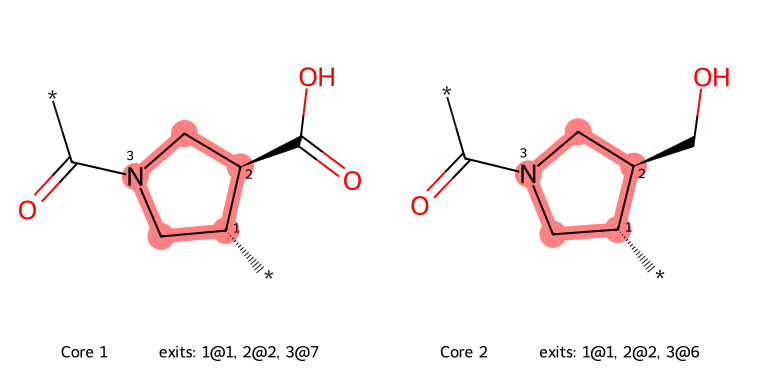

In [ ]:
#@title Label all exit vectors from the pyrrolidine core (inline image)

from rdkit import Chem
from rdkit.Chem import Draw, rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import display

# Your two core templates (with explicit '*' exits)
print("SMILES 1: [*][C@H]1[C@H](C(O)=O)CN(C([*])=O)C1",
      " SMILES 2: [*][C@H]1[C@H](CO)CN(C([*])=O)C1")

smiles_list = [
    "[*][C@H]1[C@H](C(O)=O)CN(C([*])=O)C1",
    "[*][C@H]1[C@H](CO)CN(C([*])=O)C1"
]

# Core definition consistent with the generator
CORE_SMARTS = [
    "[NX3;H0]1CCCC1",   # tertiary ring N
    "[NX3;H1]1CCCC1"    # secondary ring N (protonated/neutral)
]

def label_core_exits_on_core_atoms(smi, core_smarts=CORE_SMARTS):
    """
    Find the pyrrolidine core, detect all boundary bonds (exits),
    and put numeric labels (1,2,...) as 'atomNote' on the *core atoms*
    where each exit leaves the ring.

    Returns: (labeled molecule, core_atom_indices, exit_map)
      - exit_map: list of tuples (label, core_atom_idx, neighbor_idx)
    """
    m = Chem.MolFromSmiles(smi)
    if m is None:
        raise ValueError(f"Failed to parse: {smi}")

    # match the core
    best = None
    for s in core_smarts:
        q = Chem.MolFromSmarts(s)
        hits = m.GetSubstructMatches(q) if q else ()
        if hits:
            best = hits[0]; break
    if best is None:
        raise ValueError("Pyrrolidine core not found in this SMILES.")

    core_set = set(best)

    # find boundary bonds (one atom in core, the other outside)
    exits = []
    for b in m.GetBonds():
        a, c = b.GetBeginAtomIdx(), b.GetEndAtomIdx()
        inA, inC = (a in core_set), (c in core_set)
        if inA ^ inC:
            core_idx   = a if inA else c
            neigh_idx  = c if inA else a
            exits.append((core_idx, neigh_idx, b.GetIdx()))

    # deterministic order: sort by (core atom index, neighbor atom index)
    exits.sort(key=lambda t: (t[0], t[1]))

    # apply labels (1..n) on the core atoms; if multiple exits from same atom, join "1,3"
    labels_by_core_atom = {}
    exit_map = []
    for i, (core_idx, neigh_idx, bond_idx) in enumerate(exits, start=1):
        labels_by_core_atom.setdefault(core_idx, []).append(i)
        exit_map.append((i, core_idx, neigh_idx))

    # clear any previous notes / map numbers
    for a in m.GetAtoms():
        if a.HasProp("atomNote"): a.ClearProp("atomNote")
        if a.GetAtomMapNum(): a.SetAtomMapNum(0)

    # set notes on the core atoms
    for core_idx, nums in labels_by_core_atom.items():
        m.GetAtomWithIdx(core_idx).SetProp("atomNote", ",".join(map(str, nums)))

    # nice 2D coords
    rdDepictor.Compute2DCoords(m)
    return m, list(core_set), exit_map

# Build labeled molecules and collect highlights
labeled_mols, highlights, legends = [], [], []
for i, smi in enumerate(smiles_list, start=1):
    mol, core_atoms, exit_map = label_core_exits_on_core_atoms(smi)

    # optional: gray-highlight the core ring so exits are obvious
    highlights.append(core_atoms)
    legends.append(f"Core {i} — exits: " + ", ".join([f"{lab}@{core}" for lab, core, _ in exit_map]))
    labeled_mols.append(mol)

# Draw side-by-side (PNG) inline
# Use atomNote to show labels; also highlight the core ring atoms lightly.
highlight_atom_lists = highlights
img = Draw.MolsToGridImage(
    labeled_mols,
    molsPerRow=2,
    subImgSize=(380, 380),
    legends=legends,
    highlightAtomLists=highlight_atom_lists,
    useSVG=False
)
display(img)


In [ ]:
# ================================================================
#@title Fixed-core analog generator (RDKit) — ACID & ALCOHOL SLOTS ENFORCED
# * Locks a pyrrolidine core found in your lead
# * Forces two exits: one from a Carboxylic Acid family, one from an Alkyl-Alcohol family
# * Other exits use a rich library (with complexity gates)
# * Clean SMILES (no '*' / map numbers) + mols2grid gallery
# ---------------------------------------------------------------
# Prereqs (install in another cell):
#   mamba install -y -c conda-forge "rdkit>=2024.03" "numpy>=2,<2.3" pandas pillow ipywidgets
#   pip -q install mols2grid
# ================================================================

import os, itertools, random, sys, subprocess
import numpy as np
import pandas as pd
from IPython.display import display

from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, rdMolDescriptors
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem.rdmolops import SanitizeMol, SanitizeFlags

# --------- USER INPUTS ----------
LEAD_SMILES = "OCC1C(C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1"  # your reference / lead

# Core SMARTS (pyrrolidine ring; tertiary or secondary N)
CORES_SMARTS = [
    "[NX3;H0]1CCCC1",   # tertiary ring N (neutral)
    "[NX3;H1]1CCCC1"    # secondary ring N
]

# If you know which exit labels should be ACID / ALCOHOL, set them here.
# Example: FORCE_LABELS = {"acid": 2, "alcohol": 3}
FORCE_LABELS = {"acid": 2, "alcohol": 2}

# Enumeration size
N_PER_POS = 1000          # candidates per exit vector (sampled from library)
MAX_ENUM  = 30000       # cap on cartesian products

OUT_PREFIX = "ange_like_fixed_core_acid_alcohol_slots"

# Drug-likeness filters (slightly relaxed to allow larger motifs)
MW_RANGE   = (150, 600)
LOGP_RANGE = (-1.0, 6.0)
HBD_MAX    = 4
HBA_MAX    = 10

# ---- Structural complexity targets (tune to taste) ----
MIN_RINGS        = 2        # total rings
MIN_AROM_RINGS   = 1
MIN_HETERO       = 3        # non C/H atoms
MIN_FSP3         = 0.25     # fraction sp3 carbons
MAX_FSP3         = 0.80

# -------- Attachment libraries (attachment atom is [*:1]) ----------
# ACID slot: true acid + common isosteres (amide, sulfonamide, tetrazole, sulfonate, etc.)
ACID_POOL = [
    "[*:1]C(=O)O",                # carboxylic acid (exact motif)
    "[*:1]C(=O)N",                # amide
    "[*:1]C(=O)N(C)C",            # tertiary amide
    "[*:1]S(=O)(=O)N",            # sulfonamide
    "[*:1]S(=O)(=O)O",            # sulfonate
    "[*:1]n1nnnc1",               # 1,2,3,4-tetrazole (classic acid bioisostere)
    "[*:1]C(=O)OC",               # ester (for scope; screens often allow)
]

# ALCOHOL slot: –CH2OH (exact) + ether/amine/thiol “alcohol-like” donors/acceptors
ALCOHOL_POOL = [
    "[*:1]CO",                    # hydroxymethyl (exact motif)
    "[*:1]O",                     # ether oxygen (short)
    "[*:1]OC", "[*:1]OCC",        # alkoxy
    "[*:1]N",  "[*:1]NC",         # amine variants (bioisosteric donor)
    "[*:1]S",                     # thiol/thiol-like
]

# Rich variation for the remaining exits (unchanged from your complexity mode)
BIOISOSTERE_LIB = {
    "aryl_small": [
        "[*:1]c1ccccc1", "[*:1]c1ccccn1", "[*:1]c1ncccc1",
        "[*:1]c1ccncc1", "[*:1]c1cncnc1",
        "[*:1]c1ccc(F)cc1", "[*:1]c1cc(Cl)ccc1",
        "[*:1]c1cc(OC)ccc1", "[*:1]c1ccc(CN)cc1"
    ],
    "aryl_big": [
        "[*:1]c1cccc2ccccc12",            # naphthalene
        "[*:1]c1ccc2ncccc2c1",            # quinoline
        "[*:1]c1nccc2ccccc12",            # isoquinoline
        "[*:1]c1ccc2nccnc2c1",            # quinazoline
        "[*:1]n1c(cc2ccccc12)N"           # quinazolinone-like
    ],
    "privileged": [
        "[*:1]c1cc2ccccn2c1",             # indazole-like
        "[*:1]c1cc2ccccc2[nH]1",          # indole (N–H)
        "[*:1]c1nc2ccccc2n1",             # benzimidazole-like
        "[*:1]c1oc2ccccc2o1",             # benzodioxole
        "[*:1]c1sc2ccccc2s1"              # benzodithiin-ish
    ],
    "saturated_rings": [
        "[*:1]C1CCCCC1", "[*:1]C1CCCC1", "[*:1]C1CCC(CC1)C",
        "[*:1]C1CC2CCC1C2",               # bicyclic
        "[*:1]C1CC2CC1CC2",               # norbornane-like
        "[*:1]C1(C)CCC(C)CC1"
    ],
    "polar_heterocycles": [
        "[*:1]N1CCOCC1",                  # morpholine
        "[*:1]N1CCNCC1",                  # piperazine
        "[*:1]N1CCC(O)CC1",               # hydroxypiperidine
        "[*:1]O1CCOCC1",                  # dioxane
        "[*:1]S1CCNCC1",                  # thiomorpholine
        "[*:1]c1ncc[nH]1",                # imidazole-like
        "[*:1]c1n[nH]cc1"                 # pyrazole-like
    ],
    "linkers": [
        "[*:1]OCH2c1ccccc1", "[*:1]COc1ccccc1", "[*:1]NHCH2c1ccccc1",
        "[*:1]OCH2CH2OCH3",  "[*:1]NHCOc1ccccc1", "[*:1]SO2NHc1ccccc1",
        "[*:1]COCH2CH3", "[*:1]OCH(CH3)2", "[*:1]NHC(=O)N(CH3)2"
    ],
    "alkyl_misc": [
        "[*:1]C", "[*:1]CC", "[*:1]CCC", "[*:1]C(C)C",
        "[*:1]CF", "[*:1]C(F)F", "[*:1]CC(F)F", "[*:1]C#N",
        "[*:1]C1CC1", "[*:1]C1CCC1"
    ]
}
COMPLEXITY_BUCKETS = ["aryl_big", "privileged", "saturated_rings", "polar_heterocycles"]

# ----------------- helpers -----------------
def to_mol(s):
    m = Chem.MolFromSmiles(s)
    if m is None: return None
    try:
        SanitizeMol(m)
    except Exception:
        try:
            SanitizeMol(m, SanitizeFlags.SANITIZE_ALL ^ SanitizeFlags.SANITIZE_PROPERTIES)
        except Exception:
            return None
    return m

def props(m):
    return {
        "mw": Descriptors.MolWt(m),
        "logp": Crippen.MolLogP(m),
        "hbd": rdMolDescriptors.CalcNumHBD(m),
        "hba": rdMolDescriptors.CalcNumHBA(m)
    }

def pass_filters(m):
    p = props(m)
    return (MW_RANGE[0] <= p["mw"] <= MW_RANGE[1] and
            LOGP_RANGE[0] <= p["logp"] <= LOGP_RANGE[1] and
            p["hbd"] <= HBD_MAX and p["hba"] <= HBA_MAX)

def complex_enough(m):
    rings_total  = rdMolDescriptors.CalcNumRings(m)
    arom_rings   = rdMolDescriptors.CalcNumAromaticRings(m)
    hetero_count = sum(1 for a in m.GetAtoms() if a.GetAtomicNum() not in (1, 6))
    fsp3         = rdMolDescriptors.CalcFractionCSP3(m)
    return (rings_total >= MIN_RINGS and
            arom_rings  >= MIN_AROM_RINGS and
            hetero_count >= MIN_HETERO and
            MIN_FSP3 <= fsp3 <= MAX_FSP3)

def match_core_and_label_exits(lead_mol, core_smart_list, verbose=True):
    best = None
    for smarts in core_smart_list:
        q = Chem.MolFromSmarts(smarts)
        if not q: continue
        hits = lead_mol.GetSubstructMatches(q)
        if hits:
            best = (smarts, hits[0]); break
    if best is None:
        if verbose: print("No core match.")
        return None, [], ()
    smarts_used, match = best
    coreAts = set(match)
    if verbose:
        print(f"Using core SMARTS: {smarts_used}")
        print(f"Core atoms (idx): {sorted(coreAts)}")

    boundary_bond_ids = []
    for b in lead_mol.GetBonds():
        a, c = b.GetBeginAtomIdx(), b.GetEndAtomIdx()
        if (a in coreAts) ^ (c in coreAts):
            boundary_bond_ids.append(b.GetIdx())
    if verbose: print(f"Found {len(boundary_bond_ids)} exit bonds.")
    if not boundary_bond_ids:
        return None, [], ()

    lm = Chem.RWMol(lead_mol)
    for i in range(lm.GetNumAtoms()):
        lm.GetAtomWithIdx(i).SetBoolProp("_is_core", i in coreAts)
    lm = lm.GetMol()

    frag = Chem.FragmentOnBonds(lm, boundary_bond_ids, addDummies=True)
    Chem.SanitizeMol(frag)
    frags = Chem.GetMolFrags(frag, asMols=True, sanitizeFrags=True)

    def core_count(mol):
        return sum(1 for a in mol.GetAtoms() if a.HasProp("_is_core") and a.GetBoolProp("_is_core"))
    idx = int(np.argmax([core_count(m) for m in frags]))
    core_tmpl = frags[idx]
    if verbose: print(f"Picked fragment #{idx} with {core_count(core_tmpl)} core atoms retained.")

    label = 1
    for a in core_tmpl.GetAtoms():
        if a.GetAtomicNum() != 0:
            continue
        if any(nb.HasProp("_is_core") and nb.GetBoolProp("_is_core") for nb in a.GetNeighbors()):
            a.SetAtomMapNum(label); label += 1

    labels = sorted({a.GetAtomMapNum() for a in core_tmpl.GetAtoms()
                     if a.GetAtomicNum()==0 and a.GetAtomMapNum()>0})
    if verbose: print(f"Labeled exits: {labels}")
    return core_tmpl, labels, match

def attach_rgroup(core_mol, label, r_smi, bond_type=Chem.BondType.SINGLE):
    """
    Explicitly connect R (must contain one dummy [*:1]) to the core dummy [*:label].
    IMPORTANT: do NOT strip map numbers here; we strip once all attachments are done.
    """
    core = Chem.RWMol(core_mol)
    core_dummy_idx, core_anchor_idx = None, None
    for a in core.GetAtoms():
        if a.GetAtomicNum()==0 and a.GetAtomMapNum()==label:
            core_dummy_idx = a.GetIdx()
            nbs = [n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            core_anchor_idx = nbs[0]
            break
    if core_dummy_idx is None:
        return None

    R = Chem.MolFromSmiles(r_smi)
    if R is None: return None

    r_dummy_idx, r_anchor_idx = None, None
    for a in R.GetAtoms():
        if a.GetAtomicNum()==0 and (a.GetAtomMapNum()==1 or a.GetAtomMapNum()>0):
            r_dummy_idx = a.GetIdx()
            nbs = [n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            r_anchor_idx = nbs[0]
            break
    if r_dummy_idx is None:
        stars = [a for a in R.GetAtoms() if a.GetAtomicNum()==0]
        if not stars: return None
        a = stars[0]
        r_dummy_idx = a.GetIdx()
        nbs = [n.GetIdx() for n in a.GetNeighbors()]
        if len(nbs)!=1: return None
        r_anchor_idx = nbs[0]

    combo = Chem.CombineMols(core, R)
    rw = Chem.RWMol(combo)
    offset = core.GetNumAtoms()
    rw.AddBond(core_anchor_idx, r_anchor_idx + offset, bond_type)
    for idx in sorted([core_dummy_idx, r_dummy_idx + offset], reverse=True):
        rw.RemoveAtom(idx)
    out = rw.GetMol()
    try:
        Chem.SanitizeMol(out)
    except Exception:
        return None
    return out  # keep map numbers on remaining dummies for subsequent attachments

def strip_all_maps(m):
    m2 = Chem.Mol(m)
    for a in m2.GetAtoms():
        if a.GetAtomMapNum():
            a.SetAtomMapNum(0)
        if a.HasProp('molFileValue'):
            a.ClearProp('molFileValue')
    return m2

def enumerate_decorations(core_template, exit_labels, lib_per_pos, max_enum=20000):
    per_pos = [lib_per_pos.get(l, []) for l in exit_labels]
    if not per_pos or any(len(opts)==0 for opts in per_pos):
        return []
    combos = itertools.product(*per_pos)
    out = []
    for k, combo in enumerate(combos):
        if k >= max_enum: break
        m = Chem.Mol(core_template)
        ok = True
        for lab, r in zip(exit_labels, combo):
            m = attach_rgroup(m, lab, r)
            if m is None:
                ok = False; break
        if ok:
            m_clean = strip_all_maps(m)
            if any(a.GetAtomicNum()==0 for a in m_clean.GetAtoms()):
                continue
            out.append(m_clean)
    return out

def smiles_unique_from_mols(mols):
    seen, out = set(), []
    for m in mols:
        smi = Chem.MolToSmiles(m, isomericSmiles=True)
        if smi not in seen:
            seen.add(smi); out.append((smi, m))
    return out

# ----------------- MAIN -----------------
lead = to_mol(LEAD_SMILES)
assert lead is not None, "Lead SMILES failed to parse."

# sanity check and core/exit detection
hits_total = 0
for s in CORES_SMARTS:
    q = Chem.MolFromSmarts(s)
    hits_total += len(lead.GetSubstructMatches(q)) if q else 0
    print(f"Core SMARTS {s} -> matches: {len(lead.GetSubstructMatches(q)) if q else 0}")
if hits_total == 0:
    raise ValueError("No core SMARTS matched the lead. Update CORES_SMARTS.")

core_tmpl, labels, match = match_core_and_label_exits(lead, CORES_SMARTS, verbose=True)
if not labels:
    raise ValueError("Core matched but no exit vectors were labeled.")
print(f"Matched core. Exit positions detected: {labels}")

# ---- Choose which exit label is 'acid' and which is 'alcohol' ----
labels_sorted = sorted(labels)
acid_label    = FORCE_LABELS.get("acid")    or (labels_sorted[0] if len(labels_sorted)>=1 else None)
alcohol_label = FORCE_LABELS.get("alcohol") or (labels_sorted[1] if len(labels_sorted)>=2 else None)

if acid_label not in labels or alcohol_label not in labels:
    raise ValueError(f"Slot assignment failed. Found labels {labels}; "
                     f"got acid={acid_label}, alcohol={alcohol_label}. "
                     f"Set FORCE_LABELS (e.g., {{'acid':2,'alcohol':3}}) to override.")

print(f"Slot mapping → acid: label {acid_label} ; alcohol: label {alcohol_label}")

# Build a weighted pool favoring complex motifs for the remaining exits
mixed_pool = []
for k, vals in BIOISOSTERE_LIB.items():
    mixed_pool += vals
    if k in COMPLEXITY_BUCKETS:
        mixed_pool += vals  # oversample to bias selection
mixed_pool = list(dict.fromkeys(mixed_pool))  # unique

# Sample per family
random.seed(0)
def sample_pool(pool, n):
    return (random.sample(pool, n) if n and n < len(pool) else pool)

acid_sample    = sample_pool(ACID_POOL,    N_PER_POS)
alcohol_sample = sample_pool(ALCOHOL_POOL, N_PER_POS)
mixed_sample   = sample_pool(mixed_pool,   N_PER_POS)

# Build per-position libraries enforcing the two slots
lib_per_pos = {}
for lab in labels:
    if lab == acid_label:
        lib_per_pos[lab] = acid_sample
    elif lab == alcohol_label:
        lib_per_pos[lab] = alcohol_sample
    else:
        lib_per_pos[lab] = mixed_sample

# ENUMERATE
cands = enumerate_decorations(core_tmpl, labels, lib_per_pos, max_enum=MAX_ENUM)

# DEDUP + FILTER (drug-like + complexity)
uniq = smiles_unique_from_mols(cands)
rows, kept_mols = [], []
for smi, m in uniq:
    if not (pass_filters(m) and complex_enough(m)):
        continue
    p = props(m); p.update({"smiles": smi})
    rows.append(p); kept_mols.append(m)

print(f"Raw enumerated: {len(cands)}")
print(f"Unique: {len(uniq)}")
print(f"Pass drug-like + complexity: {len(kept_mols)}")

# DataFrame + save
cols = ["smiles", "mw", "logp", "hbd", "hba"]
df = pd.DataFrame(rows, columns=cols).sort_values("mw").reset_index(drop=True) if rows else pd.DataFrame(columns=cols)

os.makedirs("outputs", exist_ok=True)
csv_path = f"outputs/{OUT_PREFIX}_analogs.csv"
sdf_path  = f"outputs/{OUT_PREFIX}_analogs.sdf"
df.to_csv(csv_path, index=False)

w = Chem.SDWriter(sdf_path)
for mol, row in zip(kept_mols, rows):
    for k, v in row.items():
        if k != "smiles":
            mol.SetProp(k, f"{v}")
    w.write(mol)
w.close()

# mols2grid display
try:
    import mols2grid
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "mols2grid"])
    import mols2grid

if not df.empty:
    df_grid = df.copy()
    df_grid["mol"] = kept_mols
    df_grid.rename(columns={"logp":"cLogP","mw":"MW","hba":"HBA","hbd":"HBD"}, inplace=True)
    df_grid["XRAY?"] = False
    df_grid["KD_uM"] = 0.0
    df_grid["binding_pct"] = 0
    df_grid["KD"] = df_grid.apply(lambda r: f"KD {r['KD_uM']:.2f} μM, {int(r['binding_pct'])}% binding", axis=1)

    # highlight the core
    core_highlight = Chem.MolFromSmarts("[NX3]1CCCC1")
    def ring_atoms(m):
        hit = m.GetSubstructMatch(core_highlight)
        return list(hit) if hit else []
    df_grid["highlight_atoms"] = [ring_atoms(m) for m in df_grid["mol"]]

    grid = mols2grid.display(
        df_grid,
        mol_col="mol",
        smiles_col="smiles",
        subset=["img","XRAY?","KD","MW","cLogP","HBA","HBD"],
        transform={
            "XRAY?": lambda v: "XRAY? yes" if v else "XRAY? no",
            "MW":    lambda x: f"MW {x:.1f}",
            "cLogP": lambda x: f"logP {x:.2f}",
            "HBA":   lambda x: f"HBA {int(x)}",
            "HBD":   lambda x: f"HBD {int(x)}",
        },
        highlight_atoms_col="highlight_atoms",
        use_svg=True,
        n_cols=6,
        tooltip=["smiles","MW","cLogP","HBA","HBD","KD","XRAY?"],
        tooltip_placement="bottom",
    )
    display(grid)

    # preview image
    img_path = f"outputs/{OUT_PREFIX}_grid.png"
    img = MolsToGridImage(
        kept_mols[:48], molsPerRow=8, subImgSize=(250,250),
        legends=[f"{i}: {Chem.MolToSmiles(m)}" for i, m in enumerate(kept_mols[:48])],
        useSVG=False
    )
    try:
        img.save(img_path)
    except Exception:
        img_path = "(preview save failed)"
else:
    img_path = "(no image, zero molecules)"

print(f"Saved:\n  {csv_path}\n  {sdf_path}\n  {img_path}")


Core SMARTS [NX3;H0]1CCCC1 -> matches: 1
Core SMARTS [NX3;H1]1CCCC1 -> matches: 0
Using core SMARTS: [NX3;H0]1CCCC1
Core atoms (idx): [2, 3, 11, 12, 22]
Found 3 exit bonds.
Picked fragment #1 with 5 core atoms retained.
Labeled exits: [1, 2, 3]
Matched core. Exit positions detected: [1, 2, 3]
Slot mapping → acid: label 2 ; alcohol: label 2


Streaming output truncated to the last 5000 lines.
[13:50:39] SMILES Parse Error: syntax error while parsing: [*:1]OCH(CH3)2
[13:50:39] SMILES Parse Error: check for mistakes around position 8:
[13:50:39] [*:1]OCH(CH3)2
[13:50:39] ~~~~~~~^
[13:50:39] SMILES Parse Error: Failed parsing SMILES '[*:1]OCH(CH3)2' for input: '[*:1]OCH(CH3)2'
[13:50:39] SMILES Parse Error: syntax error while parsing: [*:1]OCH(CH3)2
[13:50:39] SMILES Parse Error: check for mistakes around position 8:
[13:50:39] [*:1]OCH(CH3)2
[13:50:39] ~~~~~~~^
[13:50:39] SMILES Parse Error: Failed parsing SMILES '[*:1]OCH(CH3)2' for input: '[*:1]OCH(CH3)2'
[13:50:39] SMILES Parse Error: syntax error while parsing: [*:1]OCH(CH3)2
[13:50:39] SMILES Parse Error: check for mistakes around position 8:
[13:50:39] [*:1]OCH(CH3)2
[13:50:39] ~~~~~~~^
[13:50:39] SMILES Parse Error: Failed parsing SMILES '[*:1]OCH(CH3)2' for input: '[*:1]OCH(CH3)2'
[13:50:39] SMILES Parse Error: syntax error while parsing: [*:1]OCH(CH3)2
[13:50:39] SMI

Raw enumerated: 10647
Unique: 9583
Pass drug-like + complexity: 6154


MolGridWidget()

Saved:
  outputs/ange_like_fixed_core_acid_alcohol_slots_analogs.csv
  outputs/ange_like_fixed_core_acid_alcohol_slots_analogs.sdf
  (preview save failed)


* Save all molecuels as a CSV file.

* Alternatively, you can click on the molecules you wish to screen and save them as a CSV file.

* The following script will then convert the ligands CSV into the a TEXT file `ligands.txt `with the `molecule_name,smiles`format which PocketVina can screen.

In [ ]:
# ============================================
#@title Fixed-core analog generator (enhanced, patched, with progress)
# Adds: ADMET gates, Alerts/SMARTS constraints,
#       Similarity & scaffold controls, Enumeration behavior,
#       larger libraries + external file loaders,
#       hard target number of analogues, and live progress bars.
# Patched: build_alert_catalog() (no GetNumEntries on params),
#          silenced RDKit converter warning,
#          cleaned attach_rgroup() neighbor retrieval,
#          R-group shorthand auto-fix + validation,
#          ALLOWED_ELEMENTS includes phosphorus (15).
# ============================================

import os, itertools, random, sys, subprocess, math, warnings, time
import numpy as np
import pandas as pd
from IPython.display import display

# Silence noisy RDKit converter warning (harmless)
warnings.filterwarnings(
    "ignore",
    category=RuntimeWarning,
    message=r".*FilterHierarchyMatcher.*already registered.*"
)

# ── Progress bars ─────────────────────────────────────────────
try:
    from tqdm.auto import tqdm
except Exception:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "tqdm"])
    from tqdm.auto import tqdm

PROGRESS = True  # set False to disable all bars
TQDM_BAR_FORMAT = "{l_bar}{bar}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]"

# --- Light dependency guards (uncomment if needed in vanilla Colab) ---
# try:
#     from rdkit import Chem
# except ImportError:
#     subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "rdkit-pypi"])
#     from rdkit import Chem

from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, rdMolDescriptors as rdmd
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem.rdmolops import SanitizeMol, SanitizeFlags
from rdkit.Chem import AllChem, DataStructs
from rdkit.ML.Cluster import Butina
from rdkit.Chem.FilterCatalog import FilterCatalog, FilterCatalogParams
from rdkit.Chem.Scaffolds import MurckoScaffold
from rdkit.Chem import QED
from rdkit.Chem.EnumerateStereoisomers import (
    EnumerateStereoisomers, StereoEnumerationOptions
)
from rdkit.Chem.rdchem import BondType

# Optional SA score (skipped if unavailable)
try:
    import sascorer  # pip install sascorer  (community port)
except Exception:
    sascorer = None

# ---------------- USER / RUN SETTINGS ----------------
LEAD_SMILES = "OCC1C(C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1"

# Core SMARTS (pyrrolidine ring variants)
CORES_SMARTS = ["[NX3;H0]1CCCC1", "[NX3;H1]1CCCC1"]

# Prefer to boost diversity specifically at exit labels 1 and 3:
FORCE_LABELS = {"acid": None, "alcohol": None}  # e.g. {"acid":1,"alcohol":3}

# ---- Enumeration behavior / throughput ----
N_PER_POS       = 1200          # candidates sampled per exit from each pool
TARGET_ANALOGS  = 300_000       # how many analogues to actually BUILD (pre-filter)
ENUM_RANDOM     = True         # sample unique combos at random (vs. Cartesian)
MAX_ATTEMPTS    = 20           # safety multiplier for random sampling attempts

# Per-exit bond types (defaults to SINGLE if not provided)
BOND_TYPE_PER_LABEL = {  # e.g. {1: BondType.SINGLE, 3: BondType.SINGLE}
    # 1: BondType.SINGLE,
    # 3: BondType.SINGLE
}
ALLOW_DUP_RGROUPS        = False  # Avoid same R-group used twice on one molecule
PER_LABEL_POOL_OVERRIDE  = {}     # {label: ["[*:1]CO", "…"]} to override pools per exit
ENABLE_STEREO_ENUM       = False  # Enumerate stereoisomers after build
MAX_STEREO_PER_MOL       = 4      # cap how many isomers to keep per parent

OUT_PREFIX = "ange_core_ex13_diverse"

# ---- Drug-likeness (original) ----
MW_RANGE   = (150, 750)
LOGP_RANGE = (-1.8, 7.2)
HBD_MAX    = 10
HBA_MAX    = 10

MIN_RINGS        = 2
MIN_AROM_RINGS   = 1
MIN_HETERO       = 2
MIN_FSP3         = 0.20
MAX_FSP3         = 0.90

# ---- NEW: Physicochemical / ADMET gates ----
TPSA_RANGE             = (20, 180)
ROTB_MAX               = 14
FORMAL_CHARGE_RANGE    = (-2, 2)
HEAVY_ATOM_RANGE       = (15, 80)
AROM_RINGS_MAX         = 5
HALOGEN_MAX            = 6
QED_MIN                = 0.30  # set None to disable
SA_MAX                 = None  # e.g. 6.0; requires sascorer; None = disabled

# ---- NEW: Structural alerts & SMARTS constraints ----
ENABLE_ALERTS = {"PAINS": True, "BRENK": True, "NIH": False}
MUST_HAVE_SMARTS = []  # e.g. ["c1ccccc1", "[#7]"]
MUST_NOT_SMARTS  = []  # e.g. ["N#N", "[N-]=[N+]=N"]  (azo, azide)

# Allow P=15 due to phosphonate motifs in library. Add 35/53 if you want Br/I.
ALLOWED_ELEMENTS = {1, 6, 7, 8, 9, 15, 16, 17}

# ---- NEW: Similarity & scaffold controls ----
MIN_SIM_TO_LEAD   = 0.20   # set None to disable lower bound
MAX_SIM_TO_LEAD   = 0.95   # set None to disable upper bound
SCAFFOLD_BALANCE  = False  # light balancing across scaffolds
MAX_PER_SCAFFOLD  = 1000    # cap per Bemis–Murcko scaffold (None to disable)

# ---- Diversity picking (post-filter) ----
DIVERSE_KEEP   = 10000          # final diverse cap (set None to skip)
DIVERSE_CUTOFF = 0.50          # Butina distance cutoff (lower -> more diversity)

# ------------- Libraries (attachment atom is [*:1]) ----------------
# Helper to (optionally) read extra R-groups from text/SMI files.
# Each line should be an R-group SMILES with a SINGLE dummy atom (e.g., [*:1]OCH3)
def load_rgroup_file(path):
    rg = []
    if not path or not os.path.exists(path):
        return rg
    with open(path) as f:
        for ln in f:
            s = ln.strip()
            if not s or s.startswith("#"):
                continue
            if "*" not in s:
                continue
            try:
                if Chem.MolFromSmiles(s):
                    rg.append(s)
            except Exception:
                pass
    return rg

# You can point these to files in your Colab /content or repo to append more:
EXTRA_ACID_FILE     = ""   # e.g. "/content/acid_rgroups.smi"
EXTRA_ALCOHOL_FILE  = ""   # e.g. "/content/alcohol_rgroups.smi"
EXTRA_BIO_FILE      = ""   # e.g. "/content/mixed_rgroups.smi"

# Rich, position-focused libraries for exits 1 & 3 (expanded)
ACID_POOL_POS13 = [
    # carboxylic acid + extensions
    "[*:1]C(=O)O", "[*:1]CC(=O)O", "[*:1]CCC(=O)O",
    "[*:1]CC(=O)O", "[*:1]C(C)C(=O)O",
    # aryl/hetero-aryl acids (vector changes)
    "[*:1]Cc1ccc(C(=O)O)cc1", "[*:1]Cc1ccncc1C(=O)O",
    "[*:1]C(c1ccccc1)C(=O)O", "[*:1]C(c1ccncc1)C(=O)O",
    # amide/isostere space
    "[*:1]C(=O)N", "[*:1]C(=O)N(C)C", "[*:1]C(=O)NCC",
    "[*:1]NC(=O)C", "[*:1]NC(=O)N",
    "[*:1]OC(=O)N", "[*:1]N(C)C(=O)O",
    # sulfonyls / sulfonamides
    "[*:1]S(=O)(=O)N", "[*:1]S(=O)(=O)N(C)C",
    "[*:1]S(=O)(=O)Nc1ccccc1", "[*:1]S(=O)(=O)O",
    # tetrazoles / N-rich bioisosteres
    "[*:1]n1nnnc1", "[*:1]Cn1nnnc1", "[*:1]C(n1nnnc1)C",
    # phosph(on)ates (watch TPSA)
    "[*:1]P(=O)(O)O", "[*:1]P(=O)(O)OC", "[*:1]P(=O)(OC)O",
]

ALCOHOL_POOL_POS13 = [
    # alcohols/phenols + nearby isosteres
    "[*:1]CO", "[*:1]CCO", "[*:1]CCCO", "[*:1]C(O)(C)C",
    "[*:1]C(O)C", "[*:1]C(O)CC",
    "[*:1]Oc1ccccc1", "[*:1]OCc1ccccc1",
    # ethers / amines / thioethers
    "[*:1]OC", "[*:1]OCC", "[*:1]OC(C)C", "[*:1]OCC(F)(F)F",
    "[*:1]N(C)C", "[*:1]NC", "[*:1]NCC", "[*:1]N(C)CC",
    "[*:1]S", "[*:1]SC", "[*:1]SCC", "[*:1]SCF3",
    # polar cyclic handles
    "[*:1]N1CCOCC1", "[*:1]O1CCOCC1", "[*:1]N1CCNCC1",
    "[*:1]N1CCC(O)CC1", "[*:1]O1CCOC1", "[*:1]N1CCSCC1",
    # small constrained O/N rings
    "[*:1]O1CC1", "[*:1]N1CC1", "[*:1]OC1CC1", "[*:1]N1CCC1",
]

# General decoration library for any *other* exits (expanded)
BIOISOSTERE_LIB = {
    "aryl_small": [
        "[*:1]c1ccccc1", "[*:1]c1ccccn1", "[*:1]c1ncccc1",
        "[*:1]c1ccncc1", "[*:1]c1cncnc1", "[*:1]c1ccc(F)cc1",
        "[*:1]c1cc(Cl)ccc1", "[*:1]c1cc(OC)ccc1", "[*:1]c1ccc(CN)cc1",
        # azole-like
        "[*:1]c1ncc[nH]1", "[*:1]c1n[nH]cc1", "[*:1]c1ncco1",
        "[*:1]c1nco[nH]1", "[*:1]c1nccs1", "[*:1]c1n[nH]nn1",
    ],
    "aryl_big": [
        "[*:1]c1cccc2ccccc12", "[*:1]c1ccc2ncccc2c1",
        "[*:1]c1nccc2ccccc12", "[*:1]c1ccc2nccnc2c1",
        "[*:1]n1c(cc2ccccc12)N", "[*:1]c1ccc2c(c1)cccc2",
        "[*:1]c1ccc2ccncc2c1", "[*:1]c1ccc2ncccc2c1",
        "[*:1]c1ccc2nc(N)nc2c1",
    ],
    "privileged": [
        "[*:1]c1cc2ccccn2c1", "[*:1]c1cc2ccccc2[nH]1",
        "[*:1]c1nc2ccccc2n1", "[*:1]c1oc2ccccc2o1",
        "[*:1]c1sc2ccccc2s1", "[*:1]c1ncnc2ccccc12",
        "[*:1]c1nc(N)nc2ccccc12", "[*:1]c1ncc2ccccc12",
    ],
    "saturated_rings": [
        "[*:1]C1CCCCC1", "[*:1]C1CCCC1", "[*:1]C1CCC(CC1)C",
        "[*:1]C1CC2CCC1C2", "[*:1]C1CC2CC1CC2",
        "[*:1]C1C2CC1C2",                # bicyclo[1.1.1]pentyl-like
        "[*:1]C1CC2CC3CC1CC2C3",         # bicyclo[2.2.2]octyl-like
        "[*:1]C1C2CC3CC1CC(C2)C3",       # adamantyl-like
        "[*:1]C1CC2CCC1C2",              # norbornyl-like
    ],
    "polar_heterocycles": [
        "[*:1]N1CCOCC1", "[*:1]N1CCNCC1", "[*:1]O1CCOCC1",
        "[*:1]S1CCNCC1", "[*:1]N1CCS(=O)CC1", "[*:1]O1CCN(CC1)C",
        "[*:1]N1CCOC(C1)C", "[*:1]N1COCCO1", "[*:1]N1CCNC(C1)C",
        # azabicyclics
        "[*:1]N2C1CCC2CC1", "[*:1]N2CC1CCC2C1",
    ],
    "linkers": [
        "[*:1]OCc1ccccc1", "[*:1]COc1ccccc1", "[*:1]NCc1ccccc1",
        "[*:1]OCCOC", "[*:1]NHCOc1ccccc1", "[*:1]SO2NHc1ccccc1",
        "[*:1]COCC", "[*:1]OC(C)C", "[*:1]NHC(=O)N(CH3)2",
        # polarity + vector flips
        "[*:1]OCC(F)(F)F", "[*:1]OCF3", "[*:1]SCF3", "[*:1]C(F)(F)F",
        "[*:1]C#N", "[*:1]C#CC", "[*:1]CH=CH2", "[*:1]CC(F)(F)F",
    ],
    "alkyl_misc": [
        "[*:1]C", "[*:1]CC", "[*:1]CCC", "[*:1]C(C)C", "[*:1]C(C)(C)C",
        "[*:1]CF", "[*:1]C(F)F", "[*:1]CC(F)F", "[*:1]C(F)(F)F",
        "[*:1]C1CC1", "[*:1]C1CCC1", "[*:1]C1CCCC1",
    ]
}

COMPLEXITY_BUCKETS = ["aryl_big", "privileged", "saturated_rings", "polar_heterocycles"]

# ── Extra heterocycles & spirocyclic R-groups (merged into BIOISOSTERE_LIB) ──
EXTRA_LIB = {
    # 5-membered azoles (imidazole/pyrazole/oxazole/isoxazole/thiazole families)
    "azoles_5": [
        "[*:1]c1n[nH]cc1", "[*:1]c1ncnc1", "[*:1]c1nocn1", "[*:1]c1oncc1",
        "[*:1]c1nccs1", "[*:1]c1nncnn1", "[*:1]c1nco[nH]1"
    ],
    # 1,2,3- and 1,2,4-triazoles
    "triazoles": [
        "[*:1]n1nccn1", "[*:1]n1cnn[nH]1", "[*:1]c1nnnc1", "[*:1]n1nncc1"
    ],
    # oxadiazoles / thiadiazoles
    "oxadiazoles_thiadiazoles": [
        "[*:1]c1nno1", "[*:1]c1nnco1", "[*:1]c1nnso1", "[*:1]c1nns1"
    ],
    # 6-membered diazines (pyrimidine/pyrazine/pyridazine)
    "diazines_6": [
        "[*:1]c1ncncc1", "[*:1]c1nccnc1", "[*:1]c1nncccc1"
    ],
    # purine-like fused bicycles
    "purines_fused": [
        "[*:1]n1cnc2ncnc12", "[*:1]n1c(=N)nc2ncnc12", "[*:1]n1cnc2nc[nH]c12"
    ],
    # benzo-fused heteroarenes
    "benzofused_heteroaromatics": [
        "[*:1]c1ccc2nccc2c1", "[*:1]c1ccc2ocnc2c1", "[*:1]c1ccc2scnc2c1",
        "[*:1]c1ccc2n[nH]cc2c1", "[*:1]c1ccc2ncnc2c1"
    ],
    # saturated / spirocyclic 3D vectors (bridgehead attachment)
    "spiro_bicyclic_saturated": [
        "[*:1]C1CC2CCC1C2", "[*:1]C1CC2CC1CC2", "[*:1]C1C2CC1C2",
        "[*:1]C1CC2CC3CC1CC2C3", "[*:1]C1C2CC3CC1CC(C2)C3"
    ],
    "spiro_oxa_aza": [
        "[*:1]O1CC2(CC1)OCC2", "[*:1]N1CC2(CC1)NCC2", "[*:1]O1CC2(CC1)NCC2",
        "[*:1]N1CCC2(CC1)OCC2"
    ],
}

# Optional: try RDKit’s heterocycle enumerator (if available) and add as a bucket
def _try_rdkit_heterocycles():
    try:
        from rdkit.Chem import EnumerateHeterocycles as EH
    except Exception:
        return []
    try:
        ring_list = set()
        for n in (5, 6):
            for rsmi in EH.EnumerateHeterocycles(n):   # many RDKit builds expose this
                # attach at an aromatic atom position
                ring_list.add(f"[*:1]{rsmi}")
        return list(ring_list)
    except Exception:
        return []

_rdkit_hets = _try_rdkit_heterocycles()

# Merge into your existing BIOISOSTERE_LIB
for k, vals in EXTRA_LIB.items():
    BIOISOSTERE_LIB[k] = vals + BIOISOSTERE_LIB.get(k, [])

if _rdkit_hets:
    BIOISOSTERE_LIB["rdkit_heterocycles"] = _rdkit_hets

# Weight these buckets for sampling downstream
COMPLEXITY_BUCKETS = list(set(COMPLEXITY_BUCKETS + [
    "azoles_5","triazoles","oxadiazoles_thiadiazoles","diazines_6",
    "purines_fused","benzofused_heteroaromatics","spiro_bicyclic_saturated",
    "spiro_oxa_aza","rdkit_heterocycles"
]))

# Append any external files to the pools
ACID_POOL_POS13    += load_rgroup_file(EXTRA_ACID_FILE)
ALCOHOL_POOL_POS13 += load_rgroup_file(EXTRA_ALCOHOL_FILE)
_extra_mixed = load_rgroup_file(EXTRA_BIO_FILE)
if _extra_mixed:
    # sprinkle extras into every mixed bucket (avoid duplicates per bucket)
    for k in BIOISOSTERE_LIB:
        merged = BIOISOSTERE_LIB[k] + [s for s in _extra_mixed if s not in BIOISOSTERE_LIB[k]]
        BIOISOSTERE_LIB[k] = merged

# ---- R-group library validation & auto-fix (handles CH3/CH2CH3 shorthands) ----
def _autofix_shorthand(s: str) -> str:
    """
    Minimal, safe replacements for common 'chemist shorthand' that isn't valid SMILES.
    """
    replacements = [
        ("CH(CH3)2", "C(C)C"),
        ("CH2CF3",   "C(F)(F)F"),
        ("CH2CH3",   "CC"),
        ("CH3",      "C"),
        ("CH2c1",    "Cc1"),
        ("CH(OH)",   "C(O)"),
    ]
    s2 = s
    for k, v in replacements:
        s2 = s2.replace(k, v)
    return s2

def _validate_pool(name, pool):
    ok, bad = [], []
    for s in pool:
        m = Chem.MolFromSmiles(s)
        if m is None:
            s2 = _autofix_shorthand(s)
            m2 = Chem.MolFromSmiles(s2)
            if m2 is not None:
                ok.append(s2)
            else:
                bad.append(s)
        else:
            ok.append(s)
    if bad:
        print(f"[WARN] Dropping {len(bad)} invalid SMILES from {name}. Examples: {bad[:6]}")
    # dedupe but keep order
    seen, clean = set(), []
    for s in ok:
        if s not in seen:
            seen.add(s); clean.append(s)
    return clean

ACID_POOL_POS13    = _validate_pool("ACID_POOL_POS13", ACID_POOL_POS13)
ALCOHOL_POOL_POS13 = _validate_pool("ALCOHOL_POOL_POS13", ALCOHOL_POOL_POS13)
for k in list(BIOISOSTERE_LIB):
    BIOISOSTERE_LIB[k] = _validate_pool(f"BIOISOSTERE_LIB[{k}]", BIOISOSTERE_LIB[k])

# ------------------- helpers -------------------
def to_mol(s):
    m = Chem.MolFromSmiles(s)
    if m is None: return None
    try:
        SanitizeMol(m)
    except Exception:
        try:
            SanitizeMol(m, SanitizeFlags.SANITIZE_ALL ^ SanitizeFlags.SANITIZE_PROPERTIES)
        except Exception:
            return None
    return m

def element_ok(m):
    return all(a.GetAtomicNum() in ALLOWED_ELEMENTS for a in m.GetAtoms())

def halogen_count(m):
    return sum(a.GetAtomicNum() in (9,17,35,53) for a in m.GetAtoms())

def props(m, fp_lead=None):
    p = {
        "mw": Descriptors.MolWt(m),
        "logp": Crippen.MolLogP(m),
        "hbd": rdmd.CalcNumHBD(m),
        "hba": rdmd.CalcNumHBA(m),
        "tpsa": rdmd.CalcTPSA(m),
        "rotb": rdmd.CalcNumRotatableBonds(m),
        "qed": QED.qed(m),
        "charge": Chem.GetFormalCharge(m),
        "fsp3": rdmd.CalcFractionCSP3(m),
        "rings_total": rdmd.CalcNumRings(m),
        "arom_rings": rdmd.CalcNumAromaticRings(m),
        "heavy_atoms": sum(a.GetAtomicNum() > 1 for a in m.GetAtoms()),
        "halogens": halogen_count(m),
        "sa": (sascorer.calculateScore(m) if (sascorer is not None) else None),
        "scaffold": Chem.MolToSmiles(MurckoScaffold.GetScaffoldForMol(m)) if m.GetNumAtoms() else ""
    }
    if fp_lead is not None:
        fp = AllChem.GetMorganFingerprintAsBitVect(m, 2, nBits=2048)
        p["sim_to_lead"] = DataStructs.TanimotoSimilarity(fp, fp_lead)
    else:
        p["sim_to_lead"] = None
    return p

def build_alert_catalog():
    params = FilterCatalogParams()
    added = False
    if ENABLE_ALERTS.get("PAINS", False):
        params.AddCatalog(FilterCatalogParams.FilterCatalogs.PAINS)
        added = True
    if ENABLE_ALERTS.get("BRENK", False):
        params.AddCatalog(FilterCatalogParams.FilterCatalogs.BRENK)
        added = True
    if ENABLE_ALERTS.get("NIH", False):
        # Some RDKit builds may not ship NIH; guard it
        try:
            params.AddCatalog(FilterCatalogParams.FilterCatalogs.NIH)
            added = True
        except Exception:
            pass
    if not added:
        return None  # no alerts requested
    cat = FilterCatalog(params)
    return cat

ALERT_CATALOG = build_alert_catalog()

def passes_alerts(m):
    if ALERT_CATALOG is None:
        return True
    # returns True if no match (i.e., passes)
    return ALERT_CATALOG.HasMatch(m) is False

def pass_filters(m, fp_lead=None):
    if not element_ok(m): return False
    p = props(m, fp_lead=fp_lead)

    basic = (
        MW_RANGE[0]   <= p["mw"]   <= MW_RANGE[1] and
        LOGP_RANGE[0] <= p["logp"] <= LOGP_RANGE[1] and
        p["hbd"]      <= HBD_MAX and
        p["hba"]      <= HBA_MAX and
        MIN_RINGS     <= p["rings_total"] and
        MIN_AROM_RINGS<= p["arom_rings"] and
        MIN_HETERO    <= sum(1 for a in m.GetAtoms() if a.GetAtomicNum() not in (1,6)) and
        MIN_FSP3      <= p["fsp3"] <= MAX_FSP3
    )
    if not basic: return False

    # New ADMET gates
    if not (TPSA_RANGE[0] <= p["tpsa"] <= TPSA_RANGE[1]): return False
    if p["rotb"] > ROTB_MAX: return False
    if not (FORMAL_CHARGE_RANGE[0] <= p["charge"] <= FORMAL_CHARGE_RANGE[1]): return False
    if not (HEAVY_ATOM_RANGE[0] <= p["heavy_atoms"] <= HEAVY_ATOM_RANGE[1]): return False
    if p["arom_rings"] > AROM_RINGS_MAX: return False
    if p["halogens"] > HALOGEN_MAX: return False
    if QED_MIN is not None and p["qed"] < QED_MIN: return False
    if SA_MAX is not None and sascorer is not None and p["sa"] > SA_MAX: return False

    # Similarity band
    if p["sim_to_lead"] is not None:
        if MIN_SIM_TO_LEAD is not None and p["sim_to_lead"] < MIN_SIM_TO_LEAD: return False
        if MAX_SIM_TO_LEAD is not None and p["sim_to_lead"] > MAX_SIM_TO_LEAD: return False

    # SMARTS constraints
    if MUST_HAVE_SMARTS:
        for pattern in MUST_HAVE_SMARTS:
            q = Chem.MolFromSmarts(pattern)
            if q and not m.HasSubstructMatch(q):
                return False
    if MUST_NOT_SMARTS:
        for pattern in MUST_NOT_SMARTS:
            q = Chem.MolFromSmarts(pattern)
            if q and m.HasSubstructMatch(q):
                return False

    # Alerts
    if not passes_alerts(m):
        return False

    return True

def match_core_and_label_exits(lead_mol, core_smart_list, verbose=True):
    best = None
    for smarts in core_smart_list:
        q = Chem.MolFromSmarts(smarts)
        if not q: continue
        hits = lead_mol.GetSubstructMatches(q)
        if hits:
            best = (smarts, hits[0]); break
    if best is None:
        if verbose: print("No core match.")
        return None, [], ()
    smarts_used, match = best
    coreAts = set(match)
    if verbose:
        print(f"Using core SMARTS: {smarts_used}")
        print(f"Core atoms (idx): {sorted(coreAts)}")

    boundary_bond_ids = []
    for b in lead_mol.GetBonds():
        a, c = b.GetBeginAtomIdx(), b.GetEndAtomIdx()
        if (a in coreAts) ^ (c in coreAts):
            boundary_bond_ids.append(b.GetIdx())
    if verbose: print(f"Found {len(boundary_bond_ids)} exit bonds.")
    if not boundary_bond_ids:
        return None, [], ()

    lm = Chem.RWMol(lead_mol)
    for i in range(lm.GetNumAtoms()):
        lm.GetAtomWithIdx(i).SetBoolProp("_is_core", i in coreAts)
    lm = lm.GetMol()

    frag = Chem.FragmentOnBonds(lm, boundary_bond_ids, addDummies=True)
    Chem.SanitizeMol(frag)
    frags = Chem.GetMolFrags(frag, asMols=True, sanitizeFrags=True)

    def core_count(mol):
        return sum(1 for a in mol.GetAtoms() if a.HasProp("_is_core") and a.GetBoolProp("_is_core"))
    idx = int(np.argmax([core_count(m) for m in frags]))
    core_tmpl = frags[idx]
    if verbose: print(f"Picked fragment #{idx} with {core_count(core_tmpl)} core atoms retained.")

    label = 1
    for a in core_tmpl.GetAtoms():
        if a.GetAtomicNum() != 0:
            continue
        if any(nb.HasProp("_is_core") and nb.GetBoolProp("_is_core") for nb in a.GetNeighbors()):
            a.SetAtomMapNum(label); label += 1

    labels = sorted({a.GetAtomMapNum() for a in core_tmpl.GetAtoms()
                     if a.GetAtomicNum()==0 and a.GetAtomMapNum()>0})
    if verbose: print(f"Labeled exits: {labels}")
    return core_tmpl, labels, match

def attach_rgroup(core_mol, label, r_smi, bond_type=Chem.BondType.SINGLE):
    # Connect R (must have a single dummy) to [*:label] on core; strip maps later.
    core = Chem.RWMol(core_mol)
    core_dummy_idx, core_anchor_idx = None, None
    for a in core.GetAtoms():
        if a.GetAtomicNum()==0 and a.GetAtomMapNum()==label:
            core_dummy_idx = a.GetIdx()
            nbs = [n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            core_anchor_idx = nbs[0]
            break
    if core_dummy_idx is None:
        return None

    R = Chem.MolFromSmiles(r_smi)
    if R is None: return None

    r_dummy_idx, r_anchor_idx = None, None
    for a in R.GetAtoms():
        if a.GetAtomicNum()==0 and (a.GetAtomMapNum()==1 or a.GetAtomMapNum()>0):
            r_dummy_idx = a.GetIdx()
            nbs = [n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            r_anchor_idx = nbs[0]
            break
    if r_dummy_idx is None:
        stars = [a for a in R.GetAtoms() if a.GetAtomicNum() == 0]
        if not stars:
            return None
        r_dummy_idx = stars[0].GetIdx()
        nbs = [n.GetIdx() for n in R.GetAtomWithIdx(r_dummy_idx).GetNeighbors()]
        if len(nbs)!=1: return None
        r_anchor_idx = nbs[0]

    combo = Chem.CombineMols(core, R)
    rw = Chem.RWMol(combo)
    offset = core.GetNumAtoms()
    rw.AddBond(core_anchor_idx, r_anchor_idx + offset, bond_type)
    for idx in sorted([core_dummy_idx, r_dummy_idx + offset], reverse=True):
        rw.RemoveAtom(idx)
    out = rw.GetMol()
    try:
        Chem.SanitizeMol(out)
    except Exception:
        return None
    return out  # keep remaining map numbers for subsequent attachments

def strip_all_maps(m):
    m2 = Chem.Mol(m)
    for a in m2.GetAtoms():
        if a.GetAtomMapNum():
            a.SetAtomMapNum(0)
        if a.HasProp('molFileValue'):
            a.ClearProp('molFileValue')
    return m2

def random_unique_combos(per_pos_lists, n_samples, max_attempts=10):
    """Sample unique tuples uniformly at random from the Cartesian space."""
    sizes = [len(lst) for lst in per_pos_lists]
    total = np.prod(sizes, dtype=np.int64) if sizes else 0
    n_samples = int(min(n_samples, total))
    seen = set()
    out = []
    attempts = 0
    limit = max_attempts * max(1, n_samples)
    while len(out) < n_samples and attempts < limit:
        idxs = tuple(random.randrange(sz) for sz in sizes)
        if idxs not in seen:
            seen.add(idxs)
            out.append(tuple(per_pos_lists[i][j] for i,j in enumerate(idxs)))
        attempts += 1
    return out

# --- Progress-enabled enumeration
def enumerate_decorations(core_template, exit_labels, lib_per_pos, max_enum=20000,
                          enum_random=True, allow_dup_rgroups=False, bond_map=None):
    """Enumerate analogues by attaching per-exit R-groups. Supports random unique sampling."""
    per_pos = [lib_per_pos.get(l, []) for l in exit_labels]
    if not per_pos or any(len(opts)==0 for opts in per_pos):
        return []

    total = 1
    for lst in per_pos: total *= len(lst)
    print(f"Total possible combos: {total:,}")

    # Build the iterable and know how many we will actually iterate over
    if enum_random and total > max_enum:
        combos_iterable = random_unique_combos(per_pos, max_enum, max_attempts=MAX_ATTEMPTS)
        expected = len(combos_iterable)
    else:
        expected = min(max_enum, total)
        combos_iterable = itertools.islice(itertools.product(*per_pos), expected)

    pbar = tqdm(total=expected, desc="Building", disable=not PROGRESS,
                mininterval=0.3, bar_format=TQDM_BAR_FORMAT)
    out = []
    for combo in combos_iterable:
        if (not allow_dup_rgroups) and (len(set(combo)) < len(combo)):
            pbar.update(1); continue
        m = Chem.Mol(core_template)
        ok = True
        for lab, r in zip(exit_labels, combo):
            bt = bond_map.get(lab, Chem.BondType.SINGLE) if bond_map else Chem.BondType.SINGLE
            m = attach_rgroup(m, lab, r, bond_type=bt)
            if m is None:
                ok = False; break
        if ok:
            m_clean = strip_all_maps(m)
            if not any(a.GetAtomicNum()==0 for a in m_clean.GetAtoms()):
                out.append(m_clean)
        pbar.update(1)
    pbar.close()
    return out

def smiles_unique_from_mols(mols):
    seen, out = set(), []
    it = mols if not PROGRESS else tqdm(mols, desc="Deduplicating", disable=not PROGRESS,
                                        mininterval=0.3, bar_format=TQDM_BAR_FORMAT)
    for m in it:
        smi = Chem.MolToSmiles(m, isomericSmiles=True)
        if smi not in seen:
            seen.add(smi); out.append((smi, m))
    return out

# --- Progress-enabled clustering
def pick_diverse_butina(mols, n_keep=1000, radius=2, nbits=2048, cutoff=0.55):
    """Return indices of a diverse subset using ECFP and Butina clustering."""
    if not mols: return []
    fps = [AllChem.GetMorganFingerprintAsBitVect(m, radius, nBits=nbits) for m in mols]
    dists = []
    pbar = tqdm(total=max(0, len(fps)-1), desc="Clustering (Butina)", disable=not PROGRESS,
                mininterval=0.3, bar_format=TQDM_BAR_FORMAT)
    for i in range(1, len(fps)):
        sims = DataStructs.BulkTanimotoSimilarity(fps[i], fps[:i])
        dists.extend([1 - s for s in sims])
        pbar.update(1)
    pbar.close()
    clusters = Butina.ClusterData(dists, len(fps), cutoff, isDistData=True)
    order = [c[0] for c in clusters] + [i for c in clusters for i in c[1:]]
    return order[:min(n_keep, len(order))]

# ------------------- MAIN -------------------
lead = to_mol(LEAD_SMILES)
assert lead is not None, "Lead SMILES failed to parse."
fp_lead = AllChem.GetMorganFingerprintAsBitVect(lead, 2, nBits=2048)

# core + exits
hits_total = 0
for s in CORES_SMARTS:
    q = Chem.MolFromSmarts(s)
    hits_total += len(lead.GetSubstructMatches(q)) if q else 0
    print(f"Core SMARTS {s} -> matches: {len(lead.GetSubstructMatches(q)) if q else 0}")
if hits_total == 0:
    raise ValueError("No core SMARTS matched the lead.")

core_tmpl, labels, _ = match_core_and_label_exits(lead, CORES_SMARTS, verbose=True)
if not labels:
    raise ValueError("Core matched but no exit vectors were labeled.")
print(f"Matched core. Exit labels: {labels}")

# choose which labels to use as acid/alcohol slots
labels_sorted = sorted(labels)
acid_label    = FORCE_LABELS.get("acid")
alcohol_label = FORCE_LABELS.get("alcohol")

# Default preference: if exits 1 and 3 exist, use them; else take first two labels
if acid_label is None or alcohol_label is None:
    pref = [1, 3]
    chosen = [l for l in pref if l in labels_sorted]
    while len(chosen) < 2 and len(chosen) < len(labels_sorted):
        nxt = [l for l in labels_sorted if l not in chosen]
        if not nxt: break
        chosen.append(nxt[0])
    if acid_label is None:    acid_label    = chosen[0]
    if alcohol_label is None: alcohol_label = chosen[1] if len(chosen) > 1 else chosen[0]

print(f"Slot mapping → acid: label {acid_label} ; alcohol: label {alcohol_label}")

# Build weighted mixed pool for remaining exits (simple oversampling by duplication)
mixed_pool = []
for k, vals in BIOISOSTERE_LIB.items():
    mixed_pool += vals
    if k in COMPLEXITY_BUCKETS:
        mixed_pool += vals  # oversample buckets that add complexity
# Note: making unique here removes the bias; keep as-is if you don't want oversampling to persist.
mixed_pool = list(dict.fromkeys(mixed_pool))  # unique list

# Random sampling per pool
random.seed()  # different each run
def sample_pool(pool):
    return random.sample(pool, N_PER_POS) if N_PER_POS and len(pool) > N_PER_POS else pool

acid_sample    = sample_pool(ACID_POOL_POS13)
alcohol_sample = sample_pool(ALCOHOL_POOL_POS13)
mixed_sample   = sample_pool(mixed_pool)

# Per-position libraries (enforce acid/alcohol at chosen exits + overrides)
lib_per_pos = {}
for lab in labels:
    if lab in PER_LABEL_POOL_OVERRIDE and PER_LABEL_POOL_OVERRIDE[lab]:
        lib_per_pos[lab] = PER_LABEL_POOL_OVERRIDE[lab]
    elif lab == acid_label:
        lib_per_pos[lab] = acid_sample
    elif lab == alcohol_label:
        lib_per_pos[lab] = alcohol_sample
    else:
        lib_per_pos[lab] = mixed_sample

# (Optional) capacity check
sizes = {lab: len(lib_per_pos[lab]) for lab in labels}
total = math.prod(sizes.values()) if sizes else 0
print("Exit pool sizes:", sizes)
print(f"Max Cartesian combos = {total:,}")

# Enumerate (respect TARGET_ANALOGS; random sampling optional)
cands = enumerate_decorations(
    core_tmpl,
    labels,
    lib_per_pos,
    max_enum=TARGET_ANALOGS,
    enum_random=ENUM_RANDOM,
    allow_dup_rgroups=ALLOW_DUP_RGROUPS,
    bond_map=BOND_TYPE_PER_LABEL
)

# Optional stereochemistry enumeration (capped)
if ENABLE_STEREO_ENUM and cands:
    new_cands = []
    opts = StereoEnumerationOptions(tryEmbedding=True, maxIsomers=MAX_STEREO_PER_MOL)
    it = cands if not PROGRESS else tqdm(cands, desc="Stereo enum", disable=not PROGRESS,
                                         mininterval=0.3, bar_format=TQDM_BAR_FORMAT)
    for m in it:
        try:
            isomers = list(EnumerateStereoisomers(m, options=opts))
            seen = set()
            for iso in isomers:
                smi = Chem.MolToSmiles(iso, isomericSmiles=True)
                if smi not in seen:
                    seen.add(smi)
                    new_cands.append(Chem.MolFromSmiles(smi))
        except Exception:
            new_cands.append(m)
    cands = new_cands

uniq  = smiles_unique_from_mols(cands)

# Filter & collect (with progress)
rows, kept_mols = [], []
iterable = tqdm(uniq, total=len(uniq), desc="Filtering", disable=not PROGRESS,
                mininterval=0.3, bar_format=TQDM_BAR_FORMAT)
for smi, m in iterable:
    if not pass_filters(m, fp_lead=fp_lead):
        continue
    p = props(m, fp_lead=fp_lead); p.update({"smiles": smi})
    rows.append(p); kept_mols.append(m)

print(f"Raw enumerated: {len(cands)}")
print(f"Unique: {len(uniq)}")
print(f"Pass all gates: {len(kept_mols)}")

# Optional scaffold balancing / capping
if kept_mols and (SCAFFOLD_BALANCE or (MAX_PER_SCAFFOLD is not None)):
    df_tmp = pd.DataFrame(rows)
    df_tmp["__idx"] = range(len(df_tmp))
    grp = df_tmp.groupby("scaffold", dropna=False)
    picked = []
    for scaffold, sub in grp:
        sub = sub.sample(frac=1.0, random_state=None)  # shuffle
        take = len(sub)
        if MAX_PER_SCAFFOLD is not None:
            take = min(take, MAX_PER_SCAFFOLD)
        if SCAFFOLD_BALANCE:
            take = min(take, max(1, len(df_tmp)//max(1,len(grp))*1))
        picked.extend(sub.iloc[:take]["__idx"].tolist())
    picked = sorted(set(picked))
    kept_mols = [kept_mols[i] for i in picked]
    rows      = [rows[i] for i in picked]
    print(f"After scaffold capping/balance: {len(kept_mols)}")

# Diversity selection
if kept_mols and DIVERSE_KEEP:
    idx = pick_diverse_butina(kept_mols, n_keep=min(DIVERSE_KEEP, len(kept_mols)),
                              cutoff=DIVERSE_CUTOFF)
    kept_mols = [kept_mols[i] for i in idx]
    df = pd.DataFrame(rows).iloc[idx].reset_index(drop=True)
else:
    df = pd.DataFrame(rows).reset_index(drop=True)

print(f"After diversity picking: {len(kept_mols)}")

# Save outputs
os.makedirs("outputs", exist_ok=True)
csv_path = f"outputs/{OUT_PREFIX}_analogs.csv"
sdf_path = f"outputs/{OUT_PREFIX}_analogs.sdf"
df.to_csv(csv_path, index=False)

# SDF writing with progress (index-based to avoid extra memory)
w = Chem.SDWriter(sdf_path)
rowdicts = df.to_dict(orient="records")
it = range(len(kept_mols))
if PROGRESS:
    it = tqdm(it, total=len(kept_mols), desc="Writing SDF", disable=not PROGRESS,
              mininterval=0.3, bar_format=TQDM_BAR_FORMAT)
for i in it:
    mol = kept_mols[i]
    row = rowdicts[i]
    for k, v in row.items():
        if k != "smiles" and v is not None:
            mol.SetProp(k, f"{v}")
    w.write(mol)
w.close()

# mols2grid display (skip if huge)
try:
    import mols2grid
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "mols2grid"])
    import mols2grid

if not df.empty and len(df) <= 5000:  # keep UI snappy
    df_grid = df.copy()
    df_grid["mol"] = kept_mols
    df_grid.rename(columns={"logp":"cLogP","mw":"MW","hba":"HBA","hbd":"HBD"}, inplace=True)
    df_grid["XRAY?"] = False
    df_grid["KD_uM"] = 0.0
    df_grid["binding_pct"] = 0
    df_grid["KD"] = df_grid.apply(lambda r: f"KD {r['KD_uM']:.2f} μM, {int(r['binding_pct'])}% binding", axis=1)

    # highlight the core (use first core SMARTS that matched, else fallback)
    core_highlight = Chem.MolFromSmarts(CORES_SMARTS[0]) or Chem.MolFromSmarts("[NX3]1CCCC1")
    def ring_atoms(m):
        hit = m.GetSubstructMatch(core_highlight) if core_highlight else ()
        return list(hit) if hit else []
    df_grid["highlight_atoms"] = [ring_atoms(m) for m in df_grid["mol"]]

    grid = mols2grid.display(
        df_grid,
        mol_col="mol",
        smiles_col="smiles",
        subset=["img","XRAY?","KD","MW","cLogP","HBA","HBD","tpsa","rotb","qed","sim_to_lead"],
        transform={
            "XRAY?": lambda v: "XRAY? yes" if v else "XRAY? no",
            "MW":    lambda x: f"MW {x:.1f}",
            "cLogP": lambda x: f"logP {x:.2f}",
            "HBA":   lambda x: f"HBA {int(x)}",
            "HBD":   lambda x: f"HBD {int(x)}",
            "tpsa":  lambda x: f"TPSA {x:.1f}",
            "rotb":  lambda x: f"RB {int(x)}",
            "qed":   lambda x: f"QED {x:.2f}",
            "sim_to_lead": lambda x: f"sim {x:.2f}" if x is not None else "sim NA",
        },
        highlight_atoms_col="highlight_atoms",
        use_svg=True,
        n_cols=6,
        tooltip=["smiles","MW","cLogP","HBA","HBD","tpsa","rotb","qed","sim_to_lead","scaffold"],
        tooltip_placement="bottom",
    )
    display(grid)

    # preview image
    img_path = f"outputs/{OUT_PREFIX}_grid.png"
    try:
        img = MolsToGridImage(
            kept_mols[:48], molsPerRow=8, subImgSize=(250,250),
            legends=[f"{i}: {Chem.MolToSmiles(m)}" for i, m in enumerate(kept_mols[:48])],
            useSVG=False
        )
        img.save(img_path)
    except Exception:
        img_path = "(preview save failed)"
else:
    img_path = "(no image, zero molecules or dataset too large for UI)"

print(f"Saved:\n  {csv_path}\n  {sdf_path}\n  {img_path}")

if SA_MAX is not None and sascorer is None:
    print("Note: SA_MAX is set but 'sascorer' is not available; SA filter was skipped.")

ModuleNotFoundError: No module named 'rdkit'

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [2]:
# ================================================================
#@title Fixed-core analog generator v1.3 — INTERACTIVE (Colab widgets)
# - Large R-group libraries + weighted sampling (+ optional external .smi files)
# - Robust attach (prevents ring-O over-valence; auto-charge quaternary N)
# - MorganGenerator (no ECFP deprecation), parallel cheap-first filter
# - Mols2grid preview + CSV/SDF/PNG outputs (saved in outputs/)
# - Full control via widgets for MW/logP/FSP3/rings/hetero/HBD/HBA, diversity,
#   allowed elements, sampling sizes, target analogs, etc.
# Requires: RDKit >= 2024.03, NumPy 2.x, pandas, pillow, ipywidgets.
# ================================================================

import os, sys, math, itertools, random, subprocess
os.environ.setdefault("OMP_NUM_THREADS", str(os.cpu_count() or 4))  # use all CPU cores

# --- Light deps auto-install (safe in Colab/Notebook) ---
def _ensure(pkg, imp=None):
    try:
        __import__(imp or pkg)
    except Exception:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])
        __import__(imp or pkg)

_ensure("ipywidgets>=8.0.0","ipywidgets")
_ensure("mols2grid")

try:
    from google.colab import output as _colab_out
    _colab_out.enable_custom_widget_manager()
except Exception:
    pass

# --- Core imports ---
import numpy as np
import pandas as pd
from IPython.display import display
import ipywidgets as W
from concurrent.futures import ProcessPoolExecutor, as_completed

from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, rdMolDescriptors as rdmd
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem.rdmolops import SanitizeMol, SanitizeFlags
from rdkit.Chem import DataStructs, QED
from rdkit.ML.Cluster import Butina
from rdkit.Chem.FilterCatalog import FilterCatalog, FilterCatalogParams
from rdkit.Chem.Scaffolds import MurckoScaffold
from rdkit.Chem import rdFingerprintGenerator as RFG
from rdkit import RDLogger

try:
    from tqdm import tqdm
    TQDM = True
    TQDM_BAR = "{l_bar}{bar} {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]"
except Exception:
    TQDM = False

# ---------------- Default lead & cores ----------------
DEFAULT_LEAD = "OCC1C(C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1"
CORES_SMARTS = ["[NX3;H0]1CCCC1", "[NX3;H1]1CCCC1"]

# ---------------- Libraries (same chemistry as v1.2 XL) ----------------
ACID_POOL_POS13 = [
    "[*:1]C(=O)O","[*:1]CC(=O)O","[*:1]CCC(=O)O","[*:1]C(C)C(=O)O",
    "[*:1]Cc1ccc(C(=O)O)cc1","[*:1]Cc1ccncc1C(=O)O",
    "[*:1]C(=O)N","[*:1]C(=O)N(C)C","[*:1]C(=O)NCC",
    "[*:1]NC(=O)C","[*:1]NC(=O)N","[*:1]OC(=O)N",
    "[*:1]S(=O)(=O)N","[*:1]S(=O)(=O)N(C)C","[*:1]S(=O)(=O)O",
    "[*:1]n1nnnc1","[*:1]Cn1nnnc1","[*:1]P(=O)(O)O","[*:1]P(=O)(O)OC"
]
ALCOHOL_POOL_POS13 = [
    "[*:1]CO","[*:1]CCO","[*:1]CCCO","[*:1]C(O)(C)C","[*:1]C(O)C","[*:1]C(O)CC",
    "[*:1]Oc1ccccc1","[*:1]OCc1ccccc1","[*:1]OC","[*:1]OCC","[*:1]OC(C)C","[*:1]OCC(F)(F)F",
    "[*:1]N(C)C","[*:1]NC","[*:1]NCC","[*:1]N(C)CC","[*:1]S","[*:1]SC","[*:1]SCC",
    "[*:1]N1CCOCC1","[*:1]O1CCOCC1","[*:1]N1CCNCC1","[*:1]N1CCC(O)CC1"
]
BIOISOSTERE_LIB = {
    "aryl_small": [
        "[*:1]c1ccccc1","[*:1]c1ccccn1","[*:1]c1ncccc1",
        "[*:1]c1ccncc1","[*:1]c1cncnc1","[*:1]c1ccc(F)cc1",
        "[*:1]c1cc(Cl)ccc1","[*:1]c1cc(OC)ccc1","[*:1]c1ccc(CN)cc1",
        "[*:1]c1ncc[nH]1","[*:1]c1n[nH]cc1"
    ],
    "aryl_big": [
        "[*:1]c1cccc2ccccc12","[*:1]c1ccc2ncccc2c1",
        "[*:1]c1nccc2ccccc12","[*:1]c1ccc2nccnc2c1","[*:1]n1c(cc2ccccc12)N"
    ],
    "privileged": ["[*:1]c1cc2ccccn2c1","[*:1]c1cc2ccccc2[nH]1"],
    "saturated_rings": ["[*:1]C1CCCCC1","[*:1]C1CCCC1","[*:1]C1CCC(CC1)C","[*:1]C1CC2CCC1C2","[*:1]C1CC2CC1CC2"],
    "polar_heterocycles": ["[*:1]N1CCOCC1","[*:1]N1CCNCC1","[*:1]O1CCOCC1","[*:1]S1CCNCC1","[*:1]N1CCS(=O)CC1","[*:1]c1ncc[nH]1"],
    "linkers": ["[*:1]OCc1ccccc1","[*:1]COc1ccccc1","[*:1]NCc1ccccc1","[*:1]OCCOC","[*:1]COCC","[*:1]OC(C)C","[*:1]OCC(F)(F)F","[*:1]C#N"],
    "alkyl_misc": ["[*:1]C","[*:1]CC","[*:1]CCC","[*:1]C(C)C","[*:1]C1CC1","[*:1]C1CCC1"],
    # extras
    "azoles5_big": ["[*:1]c1n[nH]cc1","[*:1]c1ncnc1","[*:1]c1nocn1","[*:1]c1nccs1","[*:1]c1nncnn1","[*:1]c1nco[nH]1","[*:1]c1nnc[nH]1"],
    "n_rich_5": ["[*:1]n1cnn[nH]1","[*:1]n1cnnn1","[*:1]c1nnnc1","[*:1]n1nncc1"],
    "diazines6_big": ["[*:1]c1ncncc1","[*:1]c1nccnc1","[*:1]c1cncnc1"],
    "purines_imidazo": ["[*:1]n1cnc2ncnc12","[*:1]n1c(=N)nc2ncnc12"],
    "benzofused_big": ["[*:1]c1ccc2nccc2c1","[*:1]c1ccc2ncnc2c1","[*:1]c1ccc2nc[nH]c2c1"],
    "bicyclic_sat_big": ["[*:1]C1CC2CCC1C2","[*:1]C1CC2CC1CC2","[*:1]C1CCC2CC1CC2"],
    "spiro_big": ["[*:1]O1CC2(CC1)OCC2","[*:1]N1CC2(CC1)NCC2","[*:1]N1CCC2(CC1)OCC2"],
}

PRIORITY_BUCKETS   = {"azoles5_big","n_rich_5","diazines6_big","purines_imidazo","benzofused_big","bicyclic_sat_big","spiro_big"}
COMPLEXITY_BUCKETS = {"aryl_big","privileged","saturated_rings","polar_heterocycles"}

# ---------------- Utilities (validators, attach, filtering) ----------------
MORGAN_GEN = RFG.GetMorganGenerator(radius=2, fpSize=2048)
def morgan_fp(m): return MORGAN_GEN.GetFingerprint(m)

def _autofix(s: str) -> str:
    for k,v in [("CH(CH3)2","C(C)C"),("CH2CF3","C(F)(F)F"),("CH2CH3","CC"),("CH3","C"),("CH2c1","Cc1"),("CH(OH)","C(O)")]:
        s = s.replace(k,v)
    return s

def _validate_lib(pool, name="pool"):
    ok, bad = [], []
    for s in pool:
        s2 = _autofix(s)
        m  = Chem.MolFromSmiles(s2)
        if not m: bad.append(s); continue
        stars = [a for a in m.GetAtoms() if a.GetAtomicNum()==0]
        if len(stars)!=1: bad.append(s); continue
        star = stars[0]
        nbs  = list(star.GetNeighbors())
        if len(nbs)!=1: bad.append(s); continue
        anchor = nbs[0]
        # Drop ring O anchors with >=3 neighbours in the fragment (would over-valence after attach)
        if anchor.GetAtomicNum()==8 and anchor.GetDegree()>=3:
            bad.append(s); continue
        ok.append(Chem.MolToSmiles(m))
    if bad:
        print(f"[WARN] Dropping {len(bad)} invalid SMILES from {name}. Examples: {bad[:6]}")
    # de-dup, preserve order
    seen, dedup = set(), []
    for s in ok:
        if s not in seen:
            seen.add(s); dedup.append(s)
    return dedup

def to_mol(s):
    m = Chem.MolFromSmiles(s)
    if m is None: return None
    try:
        SanitizeMol(m)
    except Exception:
        try:
            SanitizeMol(m, SanitizeFlags.SANITIZE_ALL ^ SanitizeFlags.SANITIZE_PROPERTIES)
        except Exception:
            return None
    return m

def match_core_and_label_exits(lead_mol, core_smart_list, verbose=True):
    best=None
    for smarts in core_smart_list:
        q = Chem.MolFromSmarts(smarts)
        if not q: continue
        hits = lead_mol.GetSubstructMatches(q)
        if hits:
            best=(smarts,hits[0]); break
    if best is None:
        if verbose: print("No core match."); return None, [], ()
    smarts_used, match = best
    coreAts=set(match)
    if verbose:
        print(f"Using core SMARTS: {smarts_used}")
        print(f"Core atoms (idx): {sorted(coreAts)}")
    boundary=[]
    for b in lead_mol.GetBonds():
        u,v=b.GetBeginAtomIdx(), b.GetEndAtomIdx()
        if (u in coreAts) ^ (v in coreAts):
            boundary.append(b.GetIdx())
    if verbose: print(f"Found {len(boundary)} exit bonds.")
    lm=Chem.RWMol(lead_mol)
    for i in range(lm.GetNumAtoms()):
        lm.GetAtomWithIdx(i).SetBoolProp("_is_core", i in coreAts)
    lm=lm.GetMol()
    frag=Chem.FragmentOnBonds(lm, boundary, addDummies=True)
    Chem.SanitizeMol(frag)
    frags=Chem.GetMolFrags(frag, asMols=True, sanitizeFrags=True)
    def core_count(m): return sum(1 for a in m.GetAtoms() if a.HasProp("_is_core") and a.GetBoolProp("_is_core"))
    idx=int(np.argmax([core_count(m) for m in frags]))
    core_tmpl=frags[idx]
    if verbose: print(f"Picked fragment #{idx} with {core_count(core_tmpl)} core atoms retained.")
    label=1
    for a in core_tmpl.GetAtoms():
        if a.GetAtomicNum()!=0: continue
        if any(nb.HasProp("_is_core") and nb.GetBoolProp("_is_core") for nb in a.GetNeighbors()):
            a.SetAtomMapNum(label); label+=1
    labels=sorted({a.GetAtomMapNum() for a in core_tmpl.GetAtoms() if a.GetAtomicNum()==0 and a.GetAtomMapNum()>0})
    if verbose: print(f"Labeled exits: {labels}")
    return core_tmpl, labels, match

def attach_rgroup(core_mol, label, r_smi, bond_type=Chem.BondType.SINGLE):
    core=Chem.RWMol(core_mol)
    core_dummy_idx=core_anchor_idx=None
    for a in core.GetAtoms():
        if a.GetAtomicNum()==0 and a.GetAtomMapNum()==label:
            core_dummy_idx=a.GetIdx()
            nbs=[n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            core_anchor_idx=nbs[0]; break
    if core_dummy_idx is None: return None
    R=Chem.MolFromSmiles(r_smi)
    if R is None: return None
    r_dummy_idx=r_anchor_idx=None
    for a in R.GetAtoms():
        if a.GetAtomicNum()==0 and (a.GetAtomMapNum()==1 or a.GetAtomMapNum()>0):
            r_dummy_idx=a.GetIdx()
            nbs=[n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            r_anchor_idx=nbs[0]; break
    if r_dummy_idx is None:
        stars=[a for a in R.GetAtoms() if a.GetAtomicNum()==0]
        if not stars: return None
        a=stars[0]; r_dummy_idx=a.GetIdx()
        nbs=[n.GetIdx() for n in a.GetNeighbors()]
        if len(nbs)!=1: return None
        r_anchor_idx=nbs[0]
    combo=Chem.CombineMols(core, R)
    rw=Chem.RWMol(combo)
    offset=core.GetNumAtoms()
    rw.AddBond(core_anchor_idx, r_anchor_idx+offset, bond_type)
    for idx in sorted([core_dummy_idx, r_dummy_idx+offset], reverse=True):
        rw.RemoveAtom(idx)
    out=rw.GetMol()
    try:
        Chem.SanitizeMol(out)
    except Exception:
        rw2=Chem.RWMol(out)
        for a in rw2.GetAtoms():
            if a.GetAtomicNum()==7 and a.GetFormalCharge()==0 and a.GetDegree()>=4:
                a.SetFormalCharge(1)
        out=rw2.GetMol()
        try:
            Chem.SanitizeMol(out)
        except Exception:
            return None
    return out

def strip_all_maps(m):
    m2=Chem.Mol(m)
    for a in m2.GetAtoms():
        if a.GetAtomMapNum(): a.SetAtomMapNum(0)
        if a.HasProp('molFileValue'): a.ClearProp('molFileValue')
    return m2

def _weighted_mixed_sample(buckets: dict, n: int, priority:set, complexity:set):
    pool=[]
    for name, vals in buckets.items():
        pool += vals
        if name in priority:   pool += vals
        if name in complexity: pool += vals
    pool=list(dict.fromkeys(pool))
    if n and len(pool)>n: return random.sample(pool, n)
    return pool

def enumerate_decorations(core_template, exit_labels, lib_per_pos,
                          max_enum=50_000, enum_random=True,
                          allow_dup_rgroups=False, bond_map=None,
                          show_progress=True):
    per_pos=[lib_per_pos.get(l, []) for l in exit_labels]
    if not per_pos or any(len(opts)==0 for opts in per_pos): return []
    def combo_iter():
        if not enum_random:
            total=1
            for opts in per_pos: total *= len(opts)
            return itertools.islice(itertools.product(*per_pos), min(total, max_enum))
        seen=set(); tries=0
        while len(seen)<max_enum and tries<max_enum*10:
            tup=tuple(random.choice(opts) for opts in per_pos)
            tries+=1
            if not allow_dup_rgroups and len(set(tup))!=len(tup): continue
            if tup in seen: continue
            seen.add(tup); yield tup
    it=combo_iter()
    if show_progress and TQDM:
        total_possible=1
        for opts in per_pos: total_possible *= len(opts)
        expected_total=min(max_enum, total_possible)
        it=tqdm(it,total=expected_total,desc="Building",mininterval=0.3,bar_format=TQDM_BAR)
    out=[]
    for combo in it:
        m=Chem.Mol(core_template); ok=True
        for lab, r in zip(exit_labels, combo):
            bt=(bond_map or {}).get(lab, Chem.BondType.SINGLE)
            m=attach_rgroup(m, lab, r, bt)
            if m is None: ok=False; break
        if ok:
            m_clean=strip_all_maps(m)
            if any(a.GetAtomicNum()==0 for a in m_clean.GetAtoms()): continue
            out.append(m_clean)
    return out

def smiles_unique_from_mols(mols, show_progress=True):
    seen,out=set(),[]
    iterator=tqdm(mols,desc="Deduplicating",mininterval=0.3,bar_format=TQDM_BAR) if (show_progress and TQDM) else mols
    for m in iterator:
        s=Chem.MolToSmiles(m,isomericSmiles=True)
        if s not in seen:
            seen.add(s); out.append((s,m))
    return out

def pick_diverse_butina(mols, n_keep=1000, radius=2, nbits=2048, cutoff=0.55, show_progress=True):
    if not mols: return []
    gen=RFG.GetMorganGenerator(radius=radius, fpSize=nbits)
    fps=[gen.GetFingerprint(m) for m in mols]
    dists=[]
    for i in range(1,len(fps)):
        sims=DataStructs.BulkTanimotoSimilarity(fps[i], fps[:i])
        dists.extend([1-s for s in sims])
    clusters=Butina.ClusterData(dists, len(fps), cutoff, isDistData=True)
    order=[c[0] for c in clusters] + [i for c in clusters for i in c[1:]]
    if show_progress and TQDM:
        tqdm(total=len(order),desc="Clustering (Butina)",bar_format=TQDM_BAR).update(len(order))
    return order[:min(n_keep,len(order))]

# -------- FAST FILTERING (cheap first + parallel) --------
def cheap_pass_filters(m, gates):
    if any(a.GetAtomicNum() not in gates["elements"] for a in m.GetAtoms()): return False
    mw   = rdmd.CalcExactMolWt(m)
    logp = Crippen.MolLogP(m)
    if not (gates["mw"][0]   <= mw   <= gates["mw"][1]):   return False
    if not (gates["logp"][0] <= logp <= gates["logp"][1]): return False
    if rdmd.CalcNumHBD(m) > gates["hbd_max"]: return False
    if rdmd.CalcNumHBA(m) > gates["hba_max"]: return False
    if rdmd.CalcNumRings(m) < gates["min_rings"]: return False
    if rdmd.CalcNumAromaticRings(m) < gates["min_arom_rings"]: return False
    hetero = sum(1 for a in m.GetAtoms() if a.GetAtomicNum() not in (1,6))
    if hetero < gates["min_hetero"]: return False
    fsp3 = rdmd.CalcFractionCSP3(m)
    if not (gates["fsp3"][0] <= fsp3 <= gates["fsp3"][1]): return False
    return True

def _worker_filter_smiles(args):
    smi, gates = args
    m = Chem.MolFromSmiles(smi)
    if m is None: return None
    try:
        Chem.SanitizeMol(m)
    except Exception:
        return None
    return smi if cheap_pass_filters(m, gates) else None

def parallel_filter(smiles, gates, max_workers=None, show_progress=True):
    if max_workers is None: max_workers=os.cpu_count() or 2
    keep=[]; futs=[]
    with ProcessPoolExecutor(max_workers=max_workers) as ex:
        for smi in smiles:
            futs.append(ex.submit(_worker_filter_smiles, (smi, gates)))
        iterator=as_completed(futs)
        if show_progress and TQDM:
            iterator=tqdm(iterator,total=len(futs),desc="Filtering",mininterval=0.3,bar_format=TQDM_BAR)
        for f in iterator:
            out=f.result()
            if out is not None: keep.append(out)
    return keep

def row_from_mol(m, smi, fp_lead=None):
    p = {
        "smiles": smi,
        "mw": Descriptors.MolWt(m),
        "logp": Crippen.MolLogP(m),
        "hbd": rdmd.CalcNumHBD(m),
        "hba": rdmd.CalcNumHBA(m),
        "tpsa": rdmd.CalcTPSA(m),
        "rotb": rdmd.CalcNumRotatableBonds(m),
        "fsp3": rdmd.CalcFractionCSP3(m),
        "rings_total": rdmd.CalcNumRings(m),
        "arom_rings": rdmd.CalcNumAromaticRings(m),
        "qed": QED.qed(m),
    }
    if fp_lead is not None:
        fp = MORGAN_GEN.GetFingerprint(m)
        p["sim_to_lead"] = DataStructs.TanimotoSimilarity(fp, fp_lead)
    else:
        p["sim_to_lead"] = None
    return p

def passes_alerts(m):  # alerts off by default; function kept for drop-in compat
    return True

# ---------------- Widgets ----------------
quiet_chk   = W.Checkbox(value=True, description="Silence RDKit error logs")
lead_txt    = W.Text(value=DEFAULT_LEAD, description="Lead SMILES", layout=W.Layout(width="100%"))
nper_slider = W.IntSlider(value=1000, min=50, max=3000, step=50, description="N per exit")
target_int  = W.IntText(value=50_000, description="Target analogs")
enum_rand   = W.Checkbox(value=True, description="Random enumeration")
nodup_chk   = W.Checkbox(value=True, description="Disallow duplicate R at exits")

# Gates
mw_min = W.FloatText(value=150.0, description="MW min")
mw_max = W.FloatText(value=650.0, description="MW max")
logp_min = W.FloatText(value=-1.0, description="logP min")
logp_max = W.FloatText(value=6.5, description="logP max")
fsp3_min = W.FloatText(value=0.25, description="FSP3 min")
fsp3_max = W.FloatText(value=0.80, description="FSP3 max")
rings_min = W.IntText(value=2, description="Min rings")
arom_min  = W.IntText(value=2, description="Min arom rings")
hetero_min= W.IntText(value=3, description="Min hetero")
hbd_max   = W.IntText(value=10, description="HBD max")
hba_max   = W.IntText(value=10, description="HBA max")

# Elements
el_H  = W.Checkbox(value=True,  description="H")
el_C  = W.Checkbox(value=True,  description="C")
el_N  = W.Checkbox(value=True,  description="N")
el_O  = W.Checkbox(value=True,  description="O")
el_F  = W.Checkbox(value=True,  description="F")
el_P  = W.Checkbox(value=True,  description="P")
el_S  = W.Checkbox(value=True,  description="S")
el_Cl = W.Checkbox(value=True,  description="Cl")
el_Br = W.Checkbox(value=False, description="Br")
el_I  = W.Checkbox(value=False, description="I")

# Diversity
div_keep   = W.IntText(value=10_000, description="Keep (diverse)")
div_cutoff = W.FloatText(value=0.50, description="Butina cutoff")

# External files (optional)
acid_file   = W.Text(value="", description="Extra acid .smi", layout=W.Layout(width="70%"))
alc_file    = W.Text(value="", description="Extra alcohol .smi", layout=W.Layout(width="70%"))
bio_file    = W.Text(value="", description="Extra bio .smi", layout=W.Layout(width="70%"))

run_btn   = W.Button(description="Run generator", button_style="success")
out_area  = W.Output()

def build_elements_set():
    allowed=set()
    if el_H.value:  allowed.add(1)
    if el_C.value:  allowed.add(6)
    if el_N.value:  allowed.add(7)
    if el_O.value:  allowed.add(8)
    if el_F.value:  allowed.add(9)
    if el_P.value:  allowed.add(15)
    if el_S.value:  allowed.add(16)
    if el_Cl.value: allowed.add(17)
    if el_Br.value: allowed.add(35)
    if el_I.value:  allowed.add(53)
    return allowed

def _load_rgroup_file(path):
    rg=[]
    if not path or not os.path.exists(path): return rg
    with open(path) as f:
        for ln in f:
            s=ln.strip()
            if not s or s.startswith("#") or "*" not in s: continue
            m=Chem.MolFromSmiles(s)
            if m: rg.append(s)
    return rg

def _save_outputs(rows, kept_mols, prefix="ange_core_ex13_diverse"):
    os.makedirs("outputs", exist_ok=True)
    csv_path=f"outputs/{prefix}_analogs.csv"
    sdf_path=f"outputs/{prefix}_analogs.sdf"
    png_path=f"outputs/{prefix}_grid.png"
    df=pd.DataFrame(rows); df.to_csv(csv_path, index=False)
    w=Chem.SDWriter(sdf_path)
    for mol, row in zip(kept_mols, df.to_dict(orient="records")):
        for k,v in row.items():
            if k!="smiles": mol.SetProp(k, f"{v}")
        w.write(mol)
    w.close()
    try:
        img=MolsToGridImage(kept_mols[:48], molsPerRow=8, subImgSize=(250,250),
                            legends=[f"{i}: {Chem.MolToSmiles(m)}" for i,m in enumerate(kept_mols[:48])],
                            useSVG=False)
        img.save(png_path)
    except Exception:
        pass
    return csv_path, sdf_path, png_path, df

def run_pipeline():
    with out_area:
        out_area.clear_output()
        if quiet_chk.value:
            RDLogger.DisableLog('rdApp.error')
        print("Validating libraries…")
        acid_pool    = _validate_lib(ACID_POOL_POS13, "ACID_POOL_POS13")
        alcohol_pool = _validate_lib(ALCOHOL_POOL_POS13, "ALCOHOL_POOL_POS13")
        mixed_lib    = {k: _validate_lib(v, f"BIOISOSTERE_LIB[{k}]") for k,v in BIOISOSTERE_LIB.items()}

        # Append external files (if provided)
        if acid_file.value:   acid_pool    += _validate_lib(_load_rgroup_file(acid_file.value),  "EXTRA_ACID_FILE")
        if alc_file.value:    alcohol_pool += _validate_lib(_load_rgroup_file(alc_file.value),   "EXTRA_ALCOHOL_FILE")
        if bio_file.value:
            extra = _validate_lib(_load_rgroup_file(bio_file.value), "EXTRA_BIO_FILE")
            if extra:
                mixed_lib["extra_file"] = extra

        # Gates from widgets
        gates = {
            "mw":  (float(mw_min.value), float(mw_max.value)),
            "logp":(float(logp_min.value), float(logp_max.value)),
            "fsp3":(float(fsp3_min.value), float(fsp3_max.value)),
            "min_rings": int(rings_min.value),
            "min_arom_rings": int(arom_min.value),
            "min_hetero": int(hetero_min.value),
            "hbd_max": int(hbd_max.value),
            "hba_max": int(hba_max.value),
            "elements": build_elements_set(),
        }

        # Lead + core
        lead = to_mol(lead_txt.value)
        assert lead is not None, "Lead SMILES failed to parse."
        fp_lead = morgan_fp(lead)

        core_tmpl, labels, _ = match_core_and_label_exits(lead, CORES_SMARTS, verbose=True)
        if not labels:
            print("Core matched but no exit vectors were labeled."); return
        # Prefer exits 1 & 3
        chosen = [l for l in (1,3) if l in labels]
        while len(chosen)<min(2,len(labels)):
            nxt=[l for l in labels if l not in chosen]
            if not nxt: break
            chosen.append(nxt[0])
        acid_label    = chosen[0]
        alcohol_label = chosen[1] if len(chosen)>1 else chosen[0]
        print(f"Slot mapping → acid: label {acid_label} ; alcohol: label {alcohol_label}")

        # Weighted mixed pool + sampling
        mixed_sample   = _weighted_mixed_sample(mixed_lib, int(nper_slider.value),
                                               PRIORITY_BUCKETS, COMPLEXITY_BUCKETS)
        def sample(pool):
            n=int(nper_slider.value)
            return random.sample(pool, n) if n and len(pool)>n else pool
        acid_sample    = sample(acid_pool)
        alcohol_sample = sample(alcohol_pool)

        lib_per_pos={}
        for lab in labels:
            if lab==acid_label:    lib_per_pos[lab]=acid_sample
            elif lab==alcohol_label: lib_per_pos[lab]=alcohol_sample
            else: lib_per_pos[lab]=mixed_sample

        sizes = {lab: len(lib_per_pos[lab]) for lab in labels}
        total = math.prod(sizes.values()) if sizes else 0
        print("Exit pool sizes:", sizes)
        print(f"Max Cartesian combos = {total:,}")

        # Enumerate
        cands = enumerate_decorations(core_tmpl, labels, lib_per_pos,
                                      max_enum=int(target_int.value),
                                      enum_random=bool(enum_rand.value),
                                      allow_dup_rgroups=not bool(nodup_chk.value),
                                      show_progress=True)

        uniq = smiles_unique_from_mols(cands, show_progress=True)
        smiles = [s for s,_ in uniq]

        # Parallel cheap filter
        survivors = parallel_filter(smiles, gates, show_progress=True)
        kept_mols, rows = [], []
        for smi in survivors:
            m=to_mol(smi)
            if m is None: continue
            if not passes_alerts(m): continue
            rows.append(row_from_mol(m, smi, fp_lead=fp_lead))
            kept_mols.append(m)

        print(f"Raw enumerated: {len(cands)}")
        print(f"Unique: {len(uniq)}")
        print(f"Pass all gates: {len(kept_mols)}")

        # Diversity
        if kept_mols and int(div_keep.value)>0:
            order = pick_diverse_butina(kept_mols, n_keep=int(div_keep.value), cutoff=float(div_cutoff.value))
            kept_mols = [kept_mols[i] for i in order]
            rows      = [rows[i]      for i in order]
        print(f"After diversity picking: {len(kept_mols)}")

        # Save + show
        csv_path, sdf_path, png_path, df = _save_outputs(rows, kept_mols)
        print(f"Saved:\n  {csv_path}\n  {sdf_path}\n  {png_path}")

        # Grid (mols2grid)
        try:
            import mols2grid
            df_grid = pd.DataFrame(rows).copy()
            df_grid["mol"]=kept_mols
            df_grid.rename(columns={"logp":"cLogP","mw":"MW","hba":"HBA","hbd":"HBD"}, inplace=True)
            grid = mols2grid.display(
                df_grid, mol_col="mol", smiles_col="smiles",
                subset=["img","MW","cLogP","HBA","HBD"], use_svg=True, n_cols=6
            )
            display(grid)
        except Exception as e:
            print("mols2grid display failed:", e)

run_btn.on_click(lambda _: run_pipeline())

ui = W.VBox([
    W.HTML("<h3>Fixed-core analog generator v1.2 — interactive</h3>"),
    W.HBox([lead_txt, quiet_chk]),
    W.HTML("<b>Sampling / enumeration</b>"),
    W.HBox([nper_slider, target_int, enum_rand, nodup_chk]),
    W.HTML("<b>Property / topology gates</b>"),
    W.HBox([mw_min, mw_max, logp_min, logp_max, fsp3_min, fsp3_max]),
    W.HBox([rings_min, arom_min, hetero_min, hbd_max, hba_max]),
    W.HTML("<b>Allowed elements</b>"),
    W.HBox([el_H, el_C, el_N, el_O, el_F, el_P, el_S, el_Cl, el_Br, el_I]),
    W.HTML("<b>Diversity</b>"),
    W.HBox([div_keep, div_cutoff]),
    W.HTML("<b>Optional external .smi files</b>"),
    acid_file, alc_file, bio_file,
    run_btn,
    out_area
])

display(ui)


* To screen these in PocketVina, we must conver the format of the .smi output file. The following cell will let you do this for your ligand selection. Input your downloaded` selection.smi` file, then output will be `ligands.txt` .

In [3]:
# ================================================================
# Fixed-core analog generator v1.2 — INTERACTIVE (Colab widgets)
# - Large R-group libraries + weighted sampling (+ optional external .smi files)
# - Robust attach (prevents ring-O over-valence; auto-charge quaternary N)
# - MorganGenerator (no ECFP deprecation), parallel cheap-first filter
# - Mols2grid preview + CSV/SDF/PNG outputs (saved in outputs/)
# - Full control via widgets for MW/logP/FSP3/rings/hetero/HBD/HBA, diversity,
#   allowed elements, sampling sizes, target analogs, etc.
# Requires: RDKit >= 2024.03, NumPy 2.x, pandas, pillow, ipywidgets.
# ================================================================

import os, sys, math, itertools, random, subprocess
os.environ.setdefault("OMP_NUM_THREADS", str(os.cpu_count() or 4))  # use all CPU cores

# --- Light deps auto-install (safe in Colab/Notebook) ---
def _ensure(pkg, imp=None):
    try:
        __import__(imp or pkg)
    except Exception:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pkg])
        __import__(imp or pkg)

_ensure("ipywidgets>=8.0.0","ipywidgets")
_ensure("mols2grid")

try:
    from google.colab import output as _colab_out
    _colab_out.enable_custom_widget_manager()
except Exception:
    pass

# --- Core imports ---
import numpy as np
import pandas as pd
from IPython.display import display
import ipywidgets as W
from concurrent.futures import ProcessPoolExecutor, as_completed

from rdkit import Chem
from rdkit.Chem import Descriptors, Crippen, rdMolDescriptors as rdmd
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem.rdmolops import SanitizeMol, SanitizeFlags
from rdkit.Chem import DataStructs, QED
from rdkit.ML.Cluster import Butina
from rdkit.Chem.FilterCatalog import FilterCatalog, FilterCatalogParams
from rdkit.Chem.Scaffolds import MurckoScaffold
from rdkit.Chem import rdFingerprintGenerator as RFG
from rdkit import RDLogger

try:
    from tqdm import tqdm
    TQDM = True
    TQDM_BAR = "{l_bar}{bar} {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]"
except Exception:
    TQDM = False

# ---------------- Default lead & cores ----------------
DEFAULT_LEAD = "OCC1C(C2=CC(F)=CC=C2)CN(C3=CC(C)=NC=C3C#N)C1"
CORES_SMARTS = ["[NX3;H0]1CCCC1", "[NX3;H1]1CCCC1"]

# ---------------- Libraries (same chemistry as v1.2 XL) ----------------
ACID_POOL_POS13 = [
    "[*:1]C(=O)O","[*:1]CC(=O)O","[*:1]CCC(=O)O","[*:1]C(C)C(=O)O",
    "[*:1]Cc1ccc(C(=O)O)cc1","[*:1]Cc1ccncc1C(=O)O",
    "[*:1]C(=O)N","[*:1]C(=O)N(C)C","[*:1]C(=O)NCC",
    "[*:1]NC(=O)C","[*:1]NC(=O)N","[*:1]OC(=O)N",
    "[*:1]S(=O)(=O)N","[*:1]S(=O)(=O)N(C)C","[*:1]S(=O)(=O)O",
    "[*:1]n1nnnc1","[*:1]Cn1nnnc1","[*:1]P(=O)(O)O","[*:1]P(=O)(O)OC"
]
ALCOHOL_POOL_POS13 = [
    "[*:1]CO","[*:1]CCO","[*:1]CCCO","[*:1]C(O)(C)C","[*:1]C(O)C","[*:1]C(O)CC",
    "[*:1]Oc1ccccc1","[*:1]OCc1ccccc1","[*:1]OC","[*:1]OCC","[*:1]OC(C)C","[*:1]OCC(F)(F)F",
    "[*:1]N(C)C","[*:1]NC","[*:1]NCC","[*:1]N(C)CC","[*:1]S","[*:1]SC","[*:1]SCC",
    "[*:1]N1CCOCC1","[*:1]O1CCOCC1","[*:1]N1CCNCC1","[*:1]N1CCC(O)CC1"
]
BIOISOSTERE_LIB = {
    "aryl_small": [
        "[*:1]c1ccccc1","[*:1]c1ccccn1","[*:1]c1ncccc1",
        "[*:1]c1ccncc1","[*:1]c1cncnc1","[*:1]c1ccc(F)cc1",
        "[*:1]c1cc(Cl)ccc1","[*:1]c1cc(OC)ccc1","[*:1]c1ccc(CN)cc1",
        "[*:1]c1ncc[nH]1","[*:1]c1n[nH]cc1"
    ],
    "aryl_big": [
        "[*:1]c1cccc2ccccc12","[*:1]c1ccc2ncccc2c1",
        "[*:1]c1nccc2ccccc12","[*:1]c1ccc2nccnc2c1","[*:1]n1c(cc2ccccc12)N"
    ],
    "privileged": ["[*:1]c1cc2ccccn2c1","[*:1]c1cc2ccccc2[nH]1"],
    "saturated_rings": ["[*:1]C1CCCCC1","[*:1]C1CCCC1","[*:1]C1CCC(CC1)C","[*:1]C1CC2CCC1C2","[*:1]C1CC2CC1CC2"],
    "polar_heterocycles": ["[*:1]N1CCOCC1","[*:1]N1CCNCC1","[*:1]O1CCOCC1","[*:1]S1CCNCC1","[*:1]N1CCS(=O)CC1","[*:1]c1ncc[nH]1"],
    "linkers": ["[*:1]OCc1ccccc1","[*:1]COc1ccccc1","[*:1]NCc1ccccc1","[*:1]OCCOC","[*:1]COCC","[*:1]OC(C)C","[*:1]OCC(F)(F)F","[*:1]C#N"],
    "alkyl_misc": ["[*:1]C","[*:1]CC","[*:1]CCC","[*:1]C(C)C","[*:1]C1CC1","[*:1]C1CCC1"],
    # extras
    "azoles5_big": ["[*:1]c1n[nH]cc1","[*:1]c1ncnc1","[*:1]c1nocn1","[*:1]c1nccs1","[*:1]c1nncnn1","[*:1]c1nco[nH]1","[*:1]c1nnc[nH]1"],
    "n_rich_5": ["[*:1]n1cnn[nH]1","[*:1]n1cnnn1","[*:1]c1nnnc1","[*:1]n1nncc1"],
    "diazines6_big": ["[*:1]c1ncncc1","[*:1]c1nccnc1","[*:1]c1cncnc1"],
    "purines_imidazo": ["[*:1]n1cnc2ncnc12","[*:1]n1c(=N)nc2ncnc12"],
    "benzofused_big": ["[*:1]c1ccc2nccc2c1","[*:1]c1ccc2ncnc2c1","[*:1]c1ccc2nc[nH]c2c1"],
    "bicyclic_sat_big": ["[*:1]C1CC2CCC1C2","[*:1]C1CC2CC1CC2","[*:1]C1CCC2CC1CC2"],
    "spiro_big": ["[*:1]O1CC2(CC1)OCC2","[*:1]N1CC2(CC1)NCC2","[*:1]N1CCC2(CC1)OCC2"],
}

PRIORITY_BUCKETS   = {"azoles5_big","n_rich_5","diazines6_big","purines_imidazo","benzofused_big","bicyclic_sat_big","spiro_big"}
COMPLEXITY_BUCKETS = {"aryl_big","privileged","saturated_rings","polar_heterocycles"}

# ---------------- Utilities (validators, attach, filtering) ----------------
MORGAN_GEN = RFG.GetMorganGenerator(radius=2, fpSize=2048)
def morgan_fp(m): return MORGAN_GEN.GetFingerprint(m)

def _autofix(s: str) -> str:
    for k,v in [("CH(CH3)2","C(C)C"),("CH2CF3","C(F)(F)F"),("CH2CH3","CC"),("CH3","C"),("CH2c1","Cc1"),("CH(OH)","C(O)")]:
        s = s.replace(k,v)
    return s

def _validate_lib(pool, name="pool"):
    ok, bad = [], []
    for s in pool:
        s2 = _autofix(s)
        m  = Chem.MolFromSmiles(s2)
        if not m: bad.append(s); continue
        stars = [a for a in m.GetAtoms() if a.GetAtomicNum()==0]
        if len(stars)!=1: bad.append(s); continue
        star = stars[0]
        nbs  = list(star.GetNeighbors())
        if len(nbs)!=1: bad.append(s); continue
        anchor = nbs[0]
        # Drop ring O anchors with >=3 neighbours in the fragment (would over-valence after attach)
        if anchor.GetAtomicNum()==8 and anchor.GetDegree()>=3:
            bad.append(s); continue
        ok.append(Chem.MolToSmiles(m))
    if bad:
        print(f"[WARN] Dropping {len(bad)} invalid SMILES from {name}. Examples: {bad[:6]}")
    # de-dup, preserve order
    seen, dedup = set(), []
    for s in ok:
        if s not in seen:
            seen.add(s); dedup.append(s)
    return dedup

def to_mol(s):
    m = Chem.MolFromSmiles(s)
    if m is None: return None
    try:
        SanitizeMol(m)
    except Exception:
        try:
            SanitizeMol(m, SanitizeFlags.SANITIZE_ALL ^ SanitizeFlags.SANITIZE_PROPERTIES)
        except Exception:
            return None
    return m

def match_core_and_label_exits(lead_mol, core_smart_list, verbose=True):
    best=None
    for smarts in core_smart_list:
        q = Chem.MolFromSmarts(smarts)
        if not q: continue
        hits = lead_mol.GetSubstructMatches(q)
        if hits:
            best=(smarts,hits[0]); break
    if best is None:
        if verbose: print("No core match."); return None, [], ()
    smarts_used, match = best
    coreAts=set(match)
    if verbose:
        print(f"Using core SMARTS: {smarts_used}")
        print(f"Core atoms (idx): {sorted(coreAts)}")
    boundary=[]
    for b in lead_mol.GetBonds():
        u,v=b.GetBeginAtomIdx(), b.GetEndAtomIdx()
        if (u in coreAts) ^ (v in coreAts):
            boundary.append(b.GetIdx())
    if verbose: print(f"Found {len(boundary)} exit bonds.")
    lm=Chem.RWMol(lead_mol)
    for i in range(lm.GetNumAtoms()):
        lm.GetAtomWithIdx(i).SetBoolProp("_is_core", i in coreAts)
    lm=lm.GetMol()
    frag=Chem.FragmentOnBonds(lm, boundary, addDummies=True)
    Chem.SanitizeMol(frag)
    frags=Chem.GetMolFrags(frag, asMols=True, sanitizeFrags=True)
    def core_count(m): return sum(1 for a in m.GetAtoms() if a.HasProp("_is_core") and a.GetBoolProp("_is_core"))
    idx=int(np.argmax([core_count(m) for m in frags]))
    core_tmpl=frags[idx]
    if verbose: print(f"Picked fragment #{idx} with {core_count(core_tmpl)} core atoms retained.")
    label=1
    for a in core_tmpl.GetAtoms():
        if a.GetAtomicNum()!=0: continue
        if any(nb.HasProp("_is_core") and nb.GetBoolProp("_is_core") for nb in a.GetNeighbors()):
            a.SetAtomMapNum(label); label+=1
    labels=sorted({a.GetAtomMapNum() for a in core_tmpl.GetAtoms() if a.GetAtomicNum()==0 and a.GetAtomMapNum()>0})
    if verbose: print(f"Labeled exits: {labels}")
    return core_tmpl, labels, match

def attach_rgroup(core_mol, label, r_smi, bond_type=Chem.BondType.SINGLE):
    core=Chem.RWMol(core_mol)
    core_dummy_idx=core_anchor_idx=None
    for a in core.GetAtoms():
        if a.GetAtomicNum()==0 and a.GetAtomMapNum()==label:
            core_dummy_idx=a.GetIdx()
            nbs=[n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            core_anchor_idx=nbs[0]; break
    if core_dummy_idx is None: return None
    R=Chem.MolFromSmiles(r_smi)
    if R is None: return None
    r_dummy_idx=r_anchor_idx=None
    for a in R.GetAtoms():
        if a.GetAtomicNum()==0 and (a.GetAtomMapNum()==1 or a.GetAtomMapNum()>0):
            r_dummy_idx=a.GetIdx()
            nbs=[n.GetIdx() for n in a.GetNeighbors()]
            if len(nbs)!=1: return None
            r_anchor_idx=nbs[0]; break
    if r_dummy_idx is None:
        stars=[a for a in R.GetAtoms() if a.GetAtomicNum()==0]
        if not stars: return None
        a=stars[0]; r_dummy_idx=a.GetIdx()
        nbs=[n.GetIdx() for n in a.GetNeighbors()]
        if len(nbs)!=1: return None
        r_anchor_idx=nbs[0]
    combo=Chem.CombineMols(core, R)
    rw=Chem.RWMol(combo)
    offset=core.GetNumAtoms()
    rw.AddBond(core_anchor_idx, r_anchor_idx+offset, bond_type)
    for idx in sorted([core_dummy_idx, r_dummy_idx+offset], reverse=True):
        rw.RemoveAtom(idx)
    out=rw.GetMol()
    try:
        Chem.SanitizeMol(out)
    except Exception:
        rw2=Chem.RWMol(out)
        for a in rw2.GetAtoms():
            if a.GetAtomicNum()==7 and a.GetFormalCharge()==0 and a.GetDegree()>=4:
                a.SetFormalCharge(1)
        out=rw2.GetMol()
        try:
            Chem.SanitizeMol(out)
        except Exception:
            return None
    return out

def strip_all_maps(m):
    m2=Chem.Mol(m)
    for a in m2.GetAtoms():
        if a.GetAtomMapNum(): a.SetAtomMapNum(0)
        if a.HasProp('molFileValue'): a.ClearProp('molFileValue')
    return m2

def _weighted_mixed_sample(buckets: dict, n: int, priority:set, complexity:set):
    pool=[]
    for name, vals in buckets.items():
        pool += vals
        if name in priority:   pool += vals
        if name in complexity: pool += vals
    pool=list(dict.fromkeys(pool))
    if n and len(pool)>n: return random.sample(pool, n)
    return pool

def enumerate_decorations(core_template, exit_labels, lib_per_pos,
                          max_enum=50_000, enum_random=True,
                          allow_dup_rgroups=False, bond_map=None,
                          show_progress=True):
    per_pos=[lib_per_pos.get(l, []) for l in exit_labels]
    if not per_pos or any(len(opts)==0 for opts in per_pos): return []
    def combo_iter():
        if not enum_random:
            total=1
            for opts in per_pos: total *= len(opts)
            return itertools.islice(itertools.product(*per_pos), min(total, max_enum))
        seen=set(); tries=0
        while len(seen)<max_enum and tries<max_enum*10:
            tup=tuple(random.choice(opts) for opts in per_pos)
            tries+=1
            if not allow_dup_rgroups and len(set(tup))!=len(tup): continue
            if tup in seen: continue
            seen.add(tup); yield tup
    it=combo_iter()
    if show_progress and TQDM:
        total_possible=1
        for opts in per_pos: total_possible *= len(opts)
        expected_total=min(max_enum, total_possible)
        it=tqdm(it,total=expected_total,desc="Building",mininterval=0.3,bar_format=TQDM_BAR)
    out=[]
    for combo in it:
        m=Chem.Mol(core_template); ok=True
        for lab, r in zip(exit_labels, combo):
            bt=(bond_map or {}).get(lab, Chem.BondType.SINGLE)
            m=attach_rgroup(m, lab, r, bt)
            if m is None: ok=False; break
        if ok:
            m_clean=strip_all_maps(m)
            if any(a.GetAtomicNum()==0 for a in m_clean.GetAtoms()): continue
            out.append(m_clean)
    return out

def smiles_unique_from_mols(mols, show_progress=True):
    seen,out=set(),[]
    iterator=tqdm(mols,desc="Deduplicating",mininterval=0.3,bar_format=TQDM_BAR) if (show_progress and TQDM) else mols
    for m in iterator:
        s=Chem.MolToSmiles(m,isomericSmiles=True)
        if s not in seen:
            seen.add(s); out.append((s,m))
    return out

def pick_diverse_butina(mols, n_keep=1000, radius=2, nbits=2048, cutoff=0.55, show_progress=True):
    if not mols: return []
    gen=RFG.GetMorganGenerator(radius=radius, fpSize=nbits)
    fps=[gen.GetFingerprint(m) for m in mols]
    dists=[]
    for i in range(1,len(fps)):
        sims=DataStructs.BulkTanimotoSimilarity(fps[i], fps[:i])
        dists.extend([1-s for s in sims])
    clusters=Butina.ClusterData(dists, len(fps), cutoff, isDistData=True)
    order=[c[0] for c in clusters] + [i for c in clusters for i in c[1:]]
    if show_progress and TQDM:
        tqdm(total=len(order),desc="Clustering (Butina)",bar_format=TQDM_BAR).update(len(order))
    return order[:min(n_keep,len(order))]

# -------- FAST FILTERING (cheap first + parallel) --------
def cheap_pass_filters(m, gates):
    if any(a.GetAtomicNum() not in gates["elements"] for a in m.GetAtoms()): return False
    mw   = rdmd.CalcExactMolWt(m)
    logp = Crippen.MolLogP(m)
    if not (gates["mw"][0]   <= mw   <= gates["mw"][1]):   return False
    if not (gates["logp"][0] <= logp <= gates["logp"][1]): return False
    if rdmd.CalcNumHBD(m) > gates["hbd_max"]: return False
    if rdmd.CalcNumHBA(m) > gates["hba_max"]: return False
    if rdmd.CalcNumRings(m) < gates["min_rings"]: return False
    if rdmd.CalcNumAromaticRings(m) < gates["min_arom_rings"]: return False
    hetero = sum(1 for a in m.GetAtoms() if a.GetAtomicNum() not in (1,6))
    if hetero < gates["min_hetero"]: return False
    fsp3 = rdmd.CalcFractionCSP3(m)
    if not (gates["fsp3"][0] <= fsp3 <= gates["fsp3"][1]): return False
    return True

def _worker_filter_smiles(args):
    smi, gates = args
    m = Chem.MolFromSmiles(smi)
    if m is None: return None
    try:
        Chem.SanitizeMol(m)
    except Exception:
        return None
    return smi if cheap_pass_filters(m, gates) else None

def parallel_filter(smiles, gates, max_workers=None, show_progress=True):
    if max_workers is None: max_workers=os.cpu_count() or 2
    keep=[]; futs=[]
    with ProcessPoolExecutor(max_workers=max_workers) as ex:
        for smi in smiles:
            futs.append(ex.submit(_worker_filter_smiles, (smi, gates)))
        iterator=as_completed(futs)
        if show_progress and TQDM:
            iterator=tqdm(iterator,total=len(futs),desc="Filtering",mininterval=0.3,bar_format=TQDM_BAR)
        for f in iterator:
            out=f.result()
            if out is not None: keep.append(out)
    return keep

def row_from_mol(m, smi, fp_lead=None):
    p = {
        "smiles": smi,
        "mw": Descriptors.MolWt(m),
        "logp": Crippen.MolLogP(m),
        "hbd": rdmd.CalcNumHBD(m),
        "hba": rdmd.CalcNumHBA(m),
        "tpsa": rdmd.CalcTPSA(m),
        "rotb": rdmd.CalcNumRotatableBonds(m),
        "fsp3": rdmd.CalcFractionCSP3(m),
        "rings_total": rdmd.CalcNumRings(m),
        "arom_rings": rdmd.CalcNumAromaticRings(m),
        "qed": QED.qed(m),
    }
    if fp_lead is not None:
        fp = MORGAN_GEN.GetFingerprint(m)
        p["sim_to_lead"] = DataStructs.TanimotoSimilarity(fp, fp_lead)
    else:
        p["sim_to_lead"] = None
    return p

def passes_alerts(m):  # alerts off by default; function kept for drop-in compat
    return True

# ---------------- Widgets ----------------
quiet_chk   = W.Checkbox(value=True, description="Silence RDKit error logs")
lead_txt    = W.Text(value=DEFAULT_LEAD, description="Lead SMILES", layout=W.Layout(width="100%"))
nper_slider = W.IntSlider(value=1000, min=50, max=3000, step=50, description="N per exit")
target_int  = W.IntText(value=50_000, description="Target analogs")
enum_rand   = W.Checkbox(value=True, description="Random enumeration")
nodup_chk   = W.Checkbox(value=True, description="Disallow duplicate R at exits")

# Gates
mw_min = W.FloatText(value=150.0, description="MW min")
mw_max = W.FloatText(value=650.0, description="MW max")
logp_min = W.FloatText(value=-1.0, description="logP min")
logp_max = W.FloatText(value=6.5, description="logP max")
fsp3_min = W.FloatText(value=0.25, description="FSP3 min")
fsp3_max = W.FloatText(value=0.80, description="FSP3 max")
rings_min = W.IntText(value=2, description="Min rings")
arom_min  = W.IntText(value=2, description="Min arom rings")
hetero_min= W.IntText(value=3, description="Min hetero")
hbd_max   = W.IntText(value=10, description="HBD max")
hba_max   = W.IntText(value=10, description="HBA max")

# Elements
el_H  = W.Checkbox(value=True,  description="H")
el_C  = W.Checkbox(value=True,  description="C")
el_N  = W.Checkbox(value=True,  description="N")
el_O  = W.Checkbox(value=True,  description="O")
el_F  = W.Checkbox(value=True,  description="F")
el_P  = W.Checkbox(value=True,  description="P")
el_S  = W.Checkbox(value=True,  description="S")
el_Cl = W.Checkbox(value=True,  description="Cl")
el_Br = W.Checkbox(value=False, description="Br")
el_I  = W.Checkbox(value=False,  description="I")

# Diversity
div_keep   = W.IntText(value=10_000, description="Keep (diverse)")
div_cutoff = W.FloatText(value=0.50, description="Butina cutoff")

# External files (optional)
acid_file   = W.Text(value="", description="Extra acid .smi", layout=W.Layout(width="70%"))
alc_file    = W.Text(value="", description="Extra alcohol .smi", layout=W.Layout(width="70%"))
bio_file    = W.Text(value="", description="Extra bio .smi", layout=W.Layout(width="70%"))

run_btn   = W.Button(description="Run generator", button_style="success")
out_area  = W.Output()

def build_elements_set():
    allowed=set()
    if el_H.value:  allowed.add(1)
    if el_C.value:  allowed.add(6)
    if el_N.value:  allowed.add(7)
    if el_O.value:  allowed.add(8)
    if el_F.value:  allowed.add(9)
    if el_P.value:  allowed.add(15)
    if el_S.value:  allowed.add(16)
    if el_Cl.value: allowed.add(17)
    if el_Br.value: allowed.add(35)
    if el_I.value:  allowed.add(53)
    return allowed

def _load_rgroup_file(path):
    rg=[]
    if not path or not os.path.exists(path): return rg
    with open(path) as f:
        for ln in f:
            s=ln.strip()
            if not s or s.startswith("#") or "*" not in s: continue
            m=Chem.MolFromSmiles(s)
            if m: rg.append(s)
    return rg

# ---- Rounded save helper (CSV rounded, SDF props set, PNG preview) ----
def _save_outputs(rows, kept_mols, prefix="ange_core_ex13_diverse"):
    os.makedirs("outputs", exist_ok=True)
    csv_path=f"outputs/{prefix}_analogs.csv"
    sdf_path=f"outputs/{prefix}_analogs.sdf"
    png_path=f"outputs/{prefix}_grid.png"

    df = pd.DataFrame(rows)
    # round for human-readable CSV
    for col, ndp in [("mw",1), ("logp",2), ("tpsa",1), ("fsp3",2)]:
        if col in df.columns:
            df[col] = df[col].astype(float).round(ndp)
    for col in ["hba","hbd","rings_total","arom_rings","rotb","halogens","heavy_atoms"]:
        if col in df.columns:
            df[col] = df[col].astype(int)

    df.to_csv(csv_path, index=False)

    w = Chem.SDWriter(sdf_path)
    for mol, row in zip(kept_mols, df.to_dict(orient="records")):
        for k, v in row.items():
            if k != "smiles":
                mol.SetProp(k, f"{v}")
        w.write(mol)
    w.close()

    # small preview image
    try:
        img = MolsToGridImage(
            kept_mols[:48], molsPerRow=8, subImgSize=(250,250),
            legends=[f"{i}: {Chem.MolToSmiles(m)}" for i, m in enumerate(kept_mols[:48])],
            useSVG=False
        )
        img.save(png_path)
    except Exception:
        pass

    return csv_path, sdf_path, png_path, df

def run_pipeline():
    with out_area:
        out_area.clear_output()
        if quiet_chk.value:
            RDLogger.DisableLog('rdApp.error')
        print("Validating libraries…")
        acid_pool    = _validate_lib(ACID_POOL_POS13, "ACID_POOL_POS13")
        alcohol_pool = _validate_lib(ALCOHOL_POOL_POS13, "ALCOHOL_POOL_POS13")
        mixed_lib    = {k: _validate_lib(v, f"BIOISOSTERE_LIB[{k}]") for k,v in BIOISOSTERE_LIB.items()}

        # Append external files (if provided)
        if acid_file.value:   acid_pool    += _validate_lib(_load_rgroup_file(acid_file.value),  "EXTRA_ACID_FILE")
        if alc_file.value:    alcohol_pool += _validate_lib(_load_rgroup_file(alc_file.value),   "EXTRA_ALCOHOL_FILE")
        if bio_file.value:
            extra = _validate_lib(_load_rgroup_file(bio_file.value), "EXTRA_BIO_FILE")
            if extra:
                mixed_lib["extra_file"] = extra

        # Gates from widgets
        gates = {
            "mw":  (float(mw_min.value), float(mw_max.value)),
            "logp":(float(logp_min.value), float(logp_max.value)),
            "fsp3":(float(fsp3_min.value), float(fsp3_max.value)),
            "min_rings": int(rings_min.value),
            "min_arom_rings": int(arom_min.value),
            "min_hetero": int(hetero_min.value),
            "hbd_max": int(hbd_max.value),
            "hba_max": int(hba_max.value),
            "elements": build_elements_set(),
        }

        # Lead + core
        lead = to_mol(lead_txt.value)
        assert lead is not None, "Lead SMILES failed to parse."
        fp_lead = morgan_fp(lead)

        core_tmpl, labels, _ = match_core_and_label_exits(lead, CORES_SMARTS, verbose=True)
        if not labels:
            print("Core matched but no exit vectors were labeled."); return
        # Prefer exits 1 & 3
        chosen = [l for l in (1,3) if l in labels]
        while len(chosen)<min(2,len(labels)):
            nxt=[l for l in labels if l not in chosen]
            if not nxt: break
            chosen.append(nxt[0])
        acid_label    = chosen[0]
        alcohol_label = chosen[1] if len(chosen)>1 else chosen[0]
        print(f"Slot mapping → acid: label {acid_label} ; alcohol: label {alcohol_label}")

        # Weighted mixed pool + sampling
        mixed_sample   = _weighted_mixed_sample(mixed_lib, int(nper_slider.value),
                                               PRIORITY_BUCKETS, COMPLEXITY_BUCKETS)
        def sample(pool):
            n=int(nper_slider.value)
            return random.sample(pool, n) if n and len(pool)>n else pool
        acid_sample    = sample(acid_pool)
        alcohol_sample = sample(alcohol_pool)

        lib_per_pos={}
        for lab in labels:
            if lab==acid_label:    lib_per_pos[lab]=acid_sample
            elif lab==alcohol_label: lib_per_pos[lab]=alcohol_sample
            else: lib_per_pos[lab]=mixed_sample

        sizes = {lab: len(lib_per_pos[lab]) for lab in labels}
        total = math.prod(sizes.values()) if sizes else 0
        print("Exit pool sizes:", sizes)
        print(f"Max Cartesian combos = {total:,}")

        # Enumerate
        cands = enumerate_decorations(core_tmpl, labels, lib_per_pos,
                                      max_enum=int(target_int.value),
                                      enum_random=bool(enum_rand.value),
                                      allow_dup_rgroups=not bool(nodup_chk.value),
                                      show_progress=True)

        uniq = smiles_unique_from_mols(cands, show_progress=True)
        smiles = [s for s,_ in uniq]

        # Parallel cheap filter
        survivors = parallel_filter(smiles, gates, show_progress=True)
        kept_mols, rows = [], []
        for smi in survivors:
            m=to_mol(smi)
            if m is None: continue
            if not passes_alerts(m): continue
            rows.append(row_from_mol(m, smi, fp_lead=fp_lead))
            kept_mols.append(m)

        print(f"Raw enumerated: {len(cands)}")
        print(f"Unique: {len(uniq)}")
        print(f"Pass all gates: {len(kept_mols)}")

        # Diversity
        if kept_mols and int(div_keep.value)>0:
            order = pick_diverse_butina(kept_mols, n_keep=int(div_keep.value), cutoff=float(div_cutoff.value))
            kept_mols = [kept_mols[i] for i in order]
            rows      = [rows[i]      for i in order]
        print(f"After diversity picking: {len(kept_mols)}")

        # Save + show (rounded CSV, labeled grid)
        csv_path, sdf_path, png_path, df = _save_outputs(rows, kept_mols)
        print(f"Saved:\n  {csv_path}\n  {sdf_path}\n  {png_path}")

        # Grid (mols2grid) — labeled + formatted values
        try:
            import mols2grid
            df_grid = pd.DataFrame(rows).copy()
            df_grid["mol"] = kept_mols

            # user-friendly column names
            df_grid.rename(columns={"logp":"cLogP","mw":"MW","hba":"HBA","hbd":"HBD"}, inplace=True)

            # optional placeholder metadata you can later update with real data
            df_grid["XRAY?"]        = False
            df_grid["KD_uM"]        = 0.0
            df_grid["binding_pct"]  = 0
            df_grid["KD"] = df_grid.apply(
                lambda r: f"KD {float(r['KD_uM']):.2f} μM, {int(r['binding_pct'])}% binding", axis=1
            )

            grid = mols2grid.display(
                df_grid,
                mol_col="mol",
                smiles_col="smiles",
                subset=["img","XRAY?","KD","MW","cLogP","HBA","HBD"],
                transform={
                    "XRAY?": lambda v: "XRAY? yes" if v else "XRAY? no",
                    "MW":    lambda x: f"MW {float(x):.1f}",
                    "cLogP": lambda x: f"logP {float(x):.2f}",
                    "HBA":   lambda x: f"HBA {int(x)}",
                    "HBD":   lambda x: f"HBD {int(x)}",
                },
                use_svg=True,
                n_cols=6,
                tooltip=["smiles","MW","cLogP","HBA","HBD"],
                tooltip_placement="bottom",
            )
            display(grid)
        except Exception as e:
            print("mols2grid display failed:", e)

run_btn.on_click(lambda _: run_pipeline())

ui = W.VBox([
    W.HTML("<h3>Fixed-core analog generator v1.2 — interactive</h3>"),
    W.HBox([lead_txt, quiet_chk]),
    W.HTML("<b>Sampling / enumeration</b>"),
    W.HBox([nper_slider, target_int, enum_rand, nodup_chk]),
    W.HTML("<b>Property / topology gates</b>"),
    W.HBox([mw_min, mw_max, logp_min, logp_max, fsp3_min, fsp3_max]),
    W.HBox([rings_min, arom_min, hetero_min, hbd_max, hba_max]),
    W.HTML("<b>Allowed elements</b>"),
    W.HBox([el_H, el_C, el_N, el_O, el_F, el_P, el_S, el_Cl, el_Br, el_I]),
    W.HTML("<b>Diversity</b>"),
    W.HBox([div_keep, div_cutoff]),
    W.HTML("<b>Optional external .smi files</b>"),
    acid_file, alc_file, bio_file,
    run_btn,
    out_area
])

display(ui)


In [ ]:
# @title Convert a CSV (with a 'smiles' column) → PocketVina ligands.txt (molecule_name,smiles)

from pathlib import Path
import csv

# ====== SETTINGS ======
INPUT_CSV   = "/content/outputs/selection (9).csv"                 # e.g. "/content/selection.csv"
OUTPUT_TXT  = "/content/ligands.txt"                   # PocketVina expects this shape: molecule_name,smiles
SMILES_COL  = "smiles"                                  # name of the column that contains SMILES
ID_COL      = None                                      # optional: use a name/id column; keep None to auto-number 0..N-1
DROP_MISSING_SMILES = True                              # skip rows where SMILES is blank
DROP_DUP_SMILES     = False                             # set True to drop duplicate SMILES
MAX_ROWS    = None                                      # None for all; or set an int to limit rows processed
# ======================

# --- locate input (falls back to upload prompt if not found) ---
in_path = Path(INPUT_CSV)
if not in_path.exists():
    # try to auto-pick the only .csv in /content
    csv_files = list(Path("/content").glob("*.csv"))
    if len(csv_files) == 1:
        in_path = csv_files[0]
        print(f"Auto-selected: {in_path}")
    else:
        try:
            from google.colab import files  # type: ignore
            print("Upload your .csv file…")
            uploaded = files.upload()
            in_path = Path(next(iter(uploaded.keys())))
        except Exception as e:
            raise FileNotFoundError(f"Couldn't find {INPUT_CSV} and no .csv to auto-pick. {e}")

# --- read CSV + collect rows ---
rows = []
with in_path.open("r", newline="", encoding="utf-8", errors="ignore") as fin:
    reader = csv.DictReader(fin)
    if reader.fieldnames is None:
        raise ValueError("CSV has no header row. Please include a header with a 'smiles' column.")
    if SMILES_COL not in reader.fieldnames:
        raise ValueError(f"Column '{SMILES_COL}' not found. Available columns: {reader.fieldnames}")

    for idx, rec in enumerate(reader):
        smi = (rec.get(SMILES_COL) or "").strip()
        if not smi and DROP_MISSING_SMILES:
            continue
        if ID_COL:
            name = (rec.get(ID_COL) or f"{idx}").strip().replace(",", "_")
        else:
            # provisional numeric name; we’ll renumber after optional de-dup
            name = str(idx)
        rows.append((name, smi))
        if MAX_ROWS and len(rows) >= MAX_ROWS:
            break

# --- optional de-dup by SMILES ---
if DROP_DUP_SMILES:
    seen, uniq = set(), []
    for name, smi in rows:
        if smi in seen:
            continue
        seen.add(smi)
        uniq.append((name, smi))
    rows = uniq

# --- if ID_COL is None, renumber names to 0..N-1 in output order ---
if ID_COL is None:
    rows = [(str(i), smi) for i, (_, smi) in enumerate(rows)]

# --- write PocketVina-style file ---
out_path = Path(OUTPUT_TXT)
out_path.parent.mkdir(parents=True, exist_ok=True)
with out_path.open("w", newline="", encoding="utf-8") as fout:
    w = csv.writer(fout)
    w.writerow(["molecule_name", "smiles"])
    w.writerows(rows)

print(f"Read {len(rows)} molecules from: {in_path.resolve()}")
print(f"Wrote: {out_path.resolve()}")

# show the first few lines to verify
print("\nPreview:")
with out_path.open() as f:
    for _ in range(6):
        line = f.readline()
        if not line: break
        print(line.rstrip())


In [ ]:
# @title Convert CSV → PocketVina ligands.txt (auto-detect delimiter)
from pathlib import Path
import csv

# ====== SETTINGS ======
INPUT_CSV  = "/content/outputs/selection (9).csv"  # change if needed
OUTPUT_TXT = "/content/ligands.txt"
ID_COL     = "index"     # use your 'index' column as molecule_name; set to None to auto-number
DROP_MISSING_SMILES = True
DROP_DUP_SMILES     = False
MAX_ROWS = None
# ======================

def detect_delimiter(path):
    with open(path, "r", encoding="utf-8-sig", newline="") as f:
        sample = f.read(65536)
    for d in [",",";","\t","|"]:
        if sample.splitlines()[0].count(d) > 0:
            return d
    try:
        return csv.Sniffer().sniff(sample, delimiters=[",",";","\t","|"]).delimiter
    except Exception:
        return ","

def find_col_idx(headers, target="smiles"):
    norm = [h.strip().lower() for h in headers]
    # exact matches first
    for k in ["smiles", "canonical_smiles"]:
        if k in norm:
            return norm.index(k)
    # any header that contains 'smiles'
    for i, h in enumerate(norm):
        if "smiles" in h:
            return i
    return None

in_path = Path(INPUT_CSV)
if not in_path.exists():
    # Auto-pick or upload
    csv_files = list(Path("/content").glob("*.csv"))
    if len(csv_files) == 1:
        in_path = csv_files[0]
        print(f"Auto-selected: {in_path}")
    else:
        from google.colab import files
        print("Upload your .csv file…")
        uploaded = files.upload()
        in_path = Path(next(iter(uploaded.keys())))

delimiter = detect_delimiter(in_path)

with open(in_path, "r", encoding="utf-8-sig", newline="") as fin:
    reader = csv.reader(fin, delimiter=delimiter)
    headers = next(reader)
    smiles_idx = find_col_idx(headers, "smiles")
    if smiles_idx is None:
        raise ValueError(
            f"No 'smiles' column found. Headers: {headers} (detected delimiter '{delimiter}')"
        )
    id_idx = None
    if ID_COL:
        norm = [h.strip().lower() for h in headers]
        if ID_COL.lower() in norm:
            id_idx = norm.index(ID_COL.lower())

    rows = []
    for idx, row in enumerate(reader):
        if MAX_ROWS and len(rows) >= MAX_ROWS:
            break
        smi = (row[smiles_idx] if smiles_idx < len(row) else "").strip()
        if not smi and DROP_MISSING_SMILES:
            continue
        name = (row[id_idx].strip() if id_idx is not None and id_idx < len(row) else str(idx))
        name = name.replace(",", "_")
        rows.append((name, smi))

# de-dup if requested
if DROP_DUP_SMILES:
    seen, uniq = set(), []
    for name, smi in rows:
        if smi in seen:
            continue
        seen.add(smi)
        uniq.append((name, smi))
    rows = uniq

# if not using an ID column, renumber 0..N-1
if ID_COL is None:
    rows = [(str(i), smi) for i, (_, smi) in enumerate(rows)]

out_path = Path(OUTPUT_TXT)
out_path.parent.mkdir(parents=True, exist_ok=True)
with open(out_path, "w", encoding="utf-8", newline="") as fout:
    w = csv.writer(fout)
    w.writerow(["molecule_name", "smiles"])
    w.writerows(rows)

print(f"Detected delimiter: '{delimiter}'")
print(f"SMILES header: {headers[smiles_idx]}")
print(f"Read {len(rows)} molecules from: {in_path.resolve()}")
print(f"Wrote: {out_path.resolve()}")

print("\nPreview:")
with open(out_path, "r", encoding="utf-8") as f:
    for _ in range(6):
        line = f.readline().rstrip()
        if not line: break
        print(line)


Detected delimiter: ';'
SMILES header: smiles
Read 53 molecules from: /content/outputs/selection (9).csv
Wrote: /content/ligands.txt

Preview:
molecule_name,smiles
31,CN(C)C(=O)C1CN(N2CCOCC2)CC1c1cccc2ccccc12
40,c1ccc(OCC2CN(N3CCOCC3)CC2n2cnnn2)cc1
991,c1cnc2ccc(C3CN(N4CCOCC4)CC3n3cnnn3)cc2c1
317,CN(C)C(=O)C1CN(CCCO)CC1c1ccccn1
32,CN(C)C(=O)C1CN(N2CCC(O)CC2)CC1COc1ccccc1
